<p style="text-align: center; font-size: 30px; font-weight: bold;">CreditRisk Pro: Predicting Loan Default with Machine Learning</p>

<!-- This is an empty block -->

<!-- This is an empty block -->


# Home Credit Default Risk Prediction

Welcome to the Home Credit Default Risk Prediction project! In this notebook, we will embark on a data science journey to explore and solve a real-world problem using machine learning.

## Problem Overview

Our primary goal in this project is to address the challenge of Home Credit Default Risk. The central task is to predict whether an applicant is likely to repay a loan, a classic supervised classification problem. Our binary labels are defined as follows:

- 0: The applicant will repay the loan on time.
- 1: The applicant will encounter difficulty in repaying the loan.

## Data Sources

Our data is generously provided by Home Credit, an organization dedicated to extending lines of credit to the unbanked population. We have access to seven distinct data sources, each contributing a piece to the puzzle:

1. **application_train/application_test**: These datasets provide crucial information about each loan application at Home Credit. Each row corresponds to a unique loan, identified by the feature SK_ID_CURR. Notably, the training dataset includes the TARGET column, which indicates loan repayment outcomes (0 or 1).

2. **bureau**: This dataset contains information about clients' prior credits from other financial institutions. Multiple previous credits can be associated with a single loan in the application data.

3. **bureau_balance**: In this dataset, we find monthly data detailing previous credits in the bureau. Each row represents one month of a previous credit, and there can be multiple rows for different months of the same credit.

4. **previous_application**: This dataset offers insights into previous loan applications at Home Credit made by clients with loans in the application data. Each previous application is represented by one row, uniquely identified by SK_ID_PREV.

5. **POS_CASH_BALANCE**: For previous point-of-sale or cash loans that clients have had with Home Credit, this dataset provides monthly data.

6. **credit_card_balance**: Here, we have monthly data concerning previous credit cards used by clients with Home Credit.

7. **installments_payment**: This dataset furnishes the payment history for previous loans at Home Credit, including rows for both successful and missed payments.

## Understanding the Challenge

To visualize the interconnectedness of these diverse datasets, we can refer to the following diagram:

![Data Sources Diagram](image.png)

While we understand the importance of leveraging all available data sources for a comprehensive analysis, we will commence by focusing on the main application training and testing data. This approach allows us to establish a robust baseline model that we can refine and expand upon as we delve deeper into the dataset.

## Research Plan

To tackle this challenging problem effectively, we will follow a structured research plan:

1. **Data Preprocessing**: We will start by loading and preprocessing the main application data. This step includes handling missing values, encoding categorical variables, and scaling numerical features.

2. **Exploratory Data Analysis (EDA)**: Our EDA phase will involve visualizing the data, understanding feature distributions, and performing correlation analysis to identify potentially important features.

3. **Feature Engineering**: We will engineer new features based on domain knowledge and insights gained from EDA.

4. **Model Building**: This stage focuses on constructing predictive models. We will begin with a simple baseline model and iteratively experiment with more advanced algorithms. Evaluation metrics such as ROC AUC and precision-recall curves will guide model selection.

5. **Model Evaluation**: We will assess model performance through cross-validation and validate against the testing dataset.

6. **Hyperparameter Tuning**: To optimize model performance, we will explore hyperparameter tuning techniques, such as GridSearchCV or RandomizedSearchCV.

7. **Business Impact**: Beyond technical metrics, we will quantify the business impact by calculating the cost savings or revenue increase achieved by our predictive model.

8. **Deployment**: Once we have a robust model, we will explore deployment options, including creating an interactive dashboard and deploying the model as an API.

9. **Monitoring and Maintenance**: Continuous monitoring of model performance and data drift detection will be crucial to ensure the model's effectiveness in a real-world setting.

10. **Documentation and Reporting**: We will document our entire research process, including methodology, results, and lessons learned, in a comprehensive report.

By following this structured plan, we aim to build a predictive model that can assist Home Credit in making informed lending decisions while minimizing the risk of default.

Let's dive into the first step: Data Preprocessing!


In [1]:
# pour editer le jeu de donne
import pandas as pd
import numpy as np
import datetime as dt
import time
from IPython.display import Image
# pour visualiser 
import seaborn as sns
import matplotlib.pyplot as plt
import missingno as msno
import plotly.express as px
import plotly.figure_factory as ff
from plotly import __version__
from plotly.offline import download_plotlyjs, init_notebook_mode, plot, iplot
import plotly.graph_objects as go
from plotly.subplots import make_subplots
import importlib.metadata
from scipy import stats
# For Notebooks
init_notebook_mode(connected=True)
%matplotlib inline

In [2]:
import warnings

# Filter out specific UserWarnings
warnings.filterwarnings("ignore", category=UserWarning, module="_distutils_hack")

# Reset warning filters at the end if needed
warnings.resetwarnings()


In [3]:
#Modification des affichages de colonnes, lignes et largeurs de colonnes pour avoir un maximum d'information
pd.set_option('display.max_columns', 300)
pd.set_option('display.max_rows', 1000)
pd.set_option('display.max_colwidth', None)

In [4]:
!python --version

# Version des librairies utilisées
print('\n'.join(f'{m.__name__} - {m.__version__}' 
                for m in globals().values() 
                if getattr(m, '__version__', None)))

print("matplotlib - ", importlib.metadata.version('matplotlib'))

Python 3.9.18
pandas - 2.1.2
numpy - 1.26.0
seaborn - 0.13.0
missingno - 0.5.2
matplotlib -  3.8.1


In [5]:
df_application_train = pd.read_csv('application_train.csv')

In [6]:
df_application_test = pd.read_csv('application_test.csv')

In [7]:
display(df_application_train.shape)

(307511, 122)

In [8]:
display(df_application_test.shape)

(48744, 121)

In [9]:
# Initialize lists to store column names for numerical and string values
numerical_columns = []
string_columns = []

# Loop through columns and categorize them
for col in df_application_train.columns:
    if pd.api.types.is_numeric_dtype(df_application_train[col]):
        numerical_columns.append(col)
    else:
        string_columns.append(col)

# Print the lists of column names
print("Numerical Columns:")
print(numerical_columns)
print('lenght:' , len(numerical_columns))

print("\nString Columns:")
print(string_columns)
print('lenght:' , len(string_columns))


Numerical Columns:
['SK_ID_CURR', 'TARGET', 'CNT_CHILDREN', 'AMT_INCOME_TOTAL', 'AMT_CREDIT', 'AMT_ANNUITY', 'AMT_GOODS_PRICE', 'REGION_POPULATION_RELATIVE', 'DAYS_BIRTH', 'DAYS_EMPLOYED', 'DAYS_REGISTRATION', 'DAYS_ID_PUBLISH', 'OWN_CAR_AGE', 'FLAG_MOBIL', 'FLAG_EMP_PHONE', 'FLAG_WORK_PHONE', 'FLAG_CONT_MOBILE', 'FLAG_PHONE', 'FLAG_EMAIL', 'CNT_FAM_MEMBERS', 'REGION_RATING_CLIENT', 'REGION_RATING_CLIENT_W_CITY', 'HOUR_APPR_PROCESS_START', 'REG_REGION_NOT_LIVE_REGION', 'REG_REGION_NOT_WORK_REGION', 'LIVE_REGION_NOT_WORK_REGION', 'REG_CITY_NOT_LIVE_CITY', 'REG_CITY_NOT_WORK_CITY', 'LIVE_CITY_NOT_WORK_CITY', 'EXT_SOURCE_1', 'EXT_SOURCE_2', 'EXT_SOURCE_3', 'APARTMENTS_AVG', 'BASEMENTAREA_AVG', 'YEARS_BEGINEXPLUATATION_AVG', 'YEARS_BUILD_AVG', 'COMMONAREA_AVG', 'ELEVATORS_AVG', 'ENTRANCES_AVG', 'FLOORSMAX_AVG', 'FLOORSMIN_AVG', 'LANDAREA_AVG', 'LIVINGAPARTMENTS_AVG', 'LIVINGAREA_AVG', 'NONLIVINGAPARTMENTS_AVG', 'NONLIVINGAREA_AVG', 'APARTMENTS_MODE', 'BASEMENTAREA_MODE', 'YEARS_BEGINEXPLUA

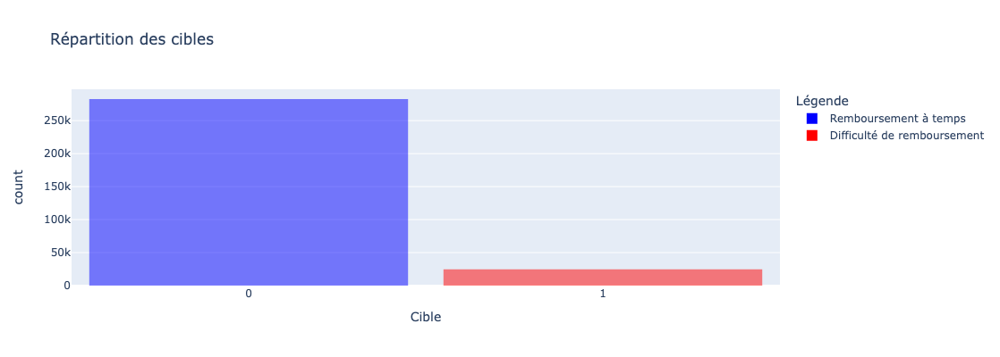

In [10]:
fig = px.histogram(df_application_train, x='TARGET', color='TARGET',
                   title='Répartition des cibles',
                   category_orders={'TARGET': [0, 1]},
                   width=400, height=400,  # Ajustez la largeur et la hauteur selon vos besoins
                   labels={'TARGET': 'Cible'},
                   color_discrete_map={0: 'blue', 1: 'red'},
                   barmode='overlay')  # Change barmode to 'overlay' for centered bars

fig.update_layout(bargap=0.1)  # Ajustez l'écart entre les barres selon vos besoins

# Définissez les valeurs de la graduation de l'axe des x pour afficher uniquement 0 et 1
fig.update_xaxes(tickvals=[0, 1], ticktext=['0', '1'])

# Utilisez la légende pour afficher des étiquettes
fig.update_layout(showlegend=True, legend_title=dict(text='Légende'),
                  legend=dict(itemsizing='constant'))

# Ajoutez des étiquettes personnalisées à la légende
fig.for_each_trace(lambda t: t.update(name='Remboursement à temps' if t.name == '0' else 'Difficulté de remboursement'))

fig.show()

In [11]:
df_application_train['TARGET'].value_counts(normalize='TRUE')

TARGET
0    0.919271
1    0.080729
Name: proportion, dtype: float64

In the context of this project, an imbalance in the target column refers to a scenario where the majority of customers (labeled as 0) are predicted to repay loans on time, while the minority class (labeled as 1) represents those expected to have difficulty repaying loans. This imbalance poses challenges in machine learning models as they might become biased towards predicting the majority class, impacting the prediction accuracy for the minority class. To address this, it's crucial to conduct a thorough error analysis, assess metrics like precision and recall, and employ techniques such as resampling, algorithm choice, and threshold adjustments to mitigate the impact of imbalance, ensuring a more balanced and effective model

In [12]:
df_application_train[string_columns].apply(pd.Series.nunique, axis = 0)

NAME_CONTRACT_TYPE             2
CODE_GENDER                    3
FLAG_OWN_CAR                   2
FLAG_OWN_REALTY                2
NAME_TYPE_SUITE                7
NAME_INCOME_TYPE               8
NAME_EDUCATION_TYPE            5
NAME_FAMILY_STATUS             6
NAME_HOUSING_TYPE              6
OCCUPATION_TYPE               18
WEEKDAY_APPR_PROCESS_START     7
ORGANIZATION_TYPE             58
FONDKAPREMONT_MODE             4
HOUSETYPE_MODE                 3
WALLSMATERIAL_MODE             7
EMERGENCYSTATE_MODE            2
dtype: int64

In [13]:
df_application_train

,SK_ID_CURR,TARGET,NAME_CONTRACT_TYPE,CODE_GENDER,FLAG_OWN_CAR,FLAG_OWN_REALTY,CNT_CHILDREN,AMT_INCOME_TOTAL,AMT_CREDIT,AMT_ANNUITY,AMT_GOODS_PRICE,NAME_TYPE_SUITE,NAME_INCOME_TYPE,NAME_EDUCATION_TYPE,NAME_FAMILY_STATUS,NAME_HOUSING_TYPE,REGION_POPULATION_RELATIVE,DAYS_BIRTH,DAYS_EMPLOYED,DAYS_REGISTRATION,DAYS_ID_PUBLISH,OWN_CAR_AGE,FLAG_MOBIL,FLAG_EMP_PHONE,FLAG_WORK_PHONE,FLAG_CONT_MOBILE,FLAG_PHONE,FLAG_EMAIL,OCCUPATION_TYPE,CNT_FAM_MEMBERS,REGION_RATING_CLIENT,REGION_RATING_CLIENT_W_CITY,WEEKDAY_APPR_PROCESS_START,HOUR_APPR_PROCESS_START,REG_REGION_NOT_LIVE_REGION,REG_REGION_NOT_WORK_REGION,LIVE_REGION_NOT_WORK_REGION,REG_CITY_NOT_LIVE_CITY,REG_CITY_NOT_WORK_CITY,LIVE_CITY_NOT_WORK_CITY,ORGANIZATION_TYPE,EXT_SOURCE_1,EXT_SOURCE_2,EXT_SOURCE_3,APARTMENTS_AVG,BASEMENTAREA_AVG,YEARS_BEGINEXPLUATATION_AVG,YEARS_BUILD_AVG,COMMONAREA_AVG,ELEVATORS_AVG,ENTRANCES_AVG,FLOORSMAX_AVG,FLOORSMIN_AVG,LANDAREA_AVG,LIVINGAPARTMENTS_AVG,LIVINGAREA_AVG,NONLIVINGAPARTMENTS_AVG,NONLIVINGAREA_AVG,APARTMENTS_MODE,BASEMENTAREA_MODE,YEARS_BEGINEXPLUATATION_MODE,YEARS_BUILD_MODE,COMMONAREA_MODE,ELEVATORS_MODE,ENTRANCES_MODE,FLOORSMAX_MODE,FLOORSMIN_MODE,LANDAREA_MODE,LIVINGAPARTMENTS_MODE,LIVINGAREA_MODE,NONLIVINGAPARTMENTS_MODE,NONLIVINGAREA_MODE,APARTMENTS_MEDI,BASEMENTAREA_MEDI,YEARS_BEGINEXPLUATATION_MEDI,YEARS_BUILD_MEDI,COMMONAREA_MEDI,ELEVATORS_MEDI,ENTRANCES_MEDI,FLOORSMAX_MEDI,FLOORSMIN_MEDI,LANDAREA_MEDI,LIVINGAPARTMENTS_MEDI,LIVINGAREA_MEDI,NONLIVINGAPARTMENTS_MEDI,NONLIVINGAREA_MEDI,FONDKAPREMONT_MODE,HOUSETYPE_MODE,TOTALAREA_MODE,WALLSMATERIAL_MODE,EMERGENCYSTATE_MODE,OBS_30_CNT_SOCIAL_CIRCLE,DEF_30_CNT_SOCIAL_CIRCLE,OBS_60_CNT_SOCIAL_CIRCLE,DEF_60_CNT_SOCIAL_CIRCLE,DAYS_LAST_PHONE_CHANGE,FLAG_DOCUMENT_2,FLAG_DOCUMENT_3,FLAG_DOCUMENT_4,FLAG_DOCUMENT_5,FLAG_DOCUMENT_6,FLAG_DOCUMENT_7,FLAG_DOCUMENT_8,FLAG_DOCUMENT_9,FLAG_DOCUMENT_10,FLAG_DOCUMENT_11,FLAG_DOCUMENT_12,FLAG_DOCUMENT_13,FLAG_DOCUMENT_14,FLAG_DOCUMENT_15,FLAG_DOCUMENT_16,FLAG_DOCUMENT_17,FLAG_DOCUMENT_18,FLAG_DOCUMENT_19,FLAG_DOCUMENT_20,FLAG_DOCUMENT_21,AMT_REQ_CREDIT_BUREAU_HOUR,AMT_REQ_CREDIT_BUREAU_DAY,AMT_REQ_CREDIT_BUREAU_WEEK,AMT_REQ_CREDIT_BUREAU_MON,AMT_REQ_CREDIT_BUREAU_QRT,AMT_REQ_CREDIT_BUREAU_YEAR
0,100002,1,Cash loans,M,N,Y,0,202500.0,406597.5,24700.5,351000.0,Unaccompanied,Working,Secondary / secondary special,Single / not married,House / apartment,0.018801,-9461,-637,-3648.0,-2120,NaN,1,1,0,1,1,0,Laborers,1.0,2,2,WEDNESDAY,10,0,0,0,0,0,0,Business Entity Type 3,0.083037,0.262949,0.139376,0.0247,0.0369,0.9722,0.6192,0.0143,0.00,0.0690,0.0833,0.1250,0.0369,0.0202,0.0190,0.0000,0.0000,0.0252,0.0383,0.9722,0.6341,0.0144,0.0000,0.0690,0.0833,0.1250,0.0377,0.0220,0.0198,0.0,0.0000,0.0250,0.0369,0.9722,0.6243,0.0144,0.00,0.0690,0.0833,0.1250,0.0375,0.0205,0.0193,0.0000,0.0000,reg oper account,block of flats,0.0149,"Stone, brick",No,2.0,2.0,2.0,2.0,-1134.0,0,1,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0.0,0.0,0.0,0.0,0.0,1.0
1,100003,0,Cash loans,F,N,N,0,270000.0,1293502.5,35698.5,1129500.0,Family,State servant,Higher education,Married,House / apartment,0.003541,-16765,-1188,-1186.0,-291,NaN,1,1,0,1,1,0,Core staff,2.0,1,1,MONDAY,11,0,0,0,0,0,0,School,0.311267,0.622246,NaN,0.0959,0.0529,0.9851,0.7960,0.0605,0.08,0.0345,0.2917,0.3333,0.0130,0.0773,0.0549,0.0039,0.0098,0.0924,0.0538,0.9851,0.8040,0.0497,0.0806,0.0345,0.2917,0.3333,0.0128,0.0790,0.0554,0.0,0.0000,0.0968,0.0529,0.9851,0.7987,0.0608,0.08,0.0345,0.2917,0.3333,0.0132,0.0787,0.0558,0.0039,0.0100,reg oper account,block of flats,0.0714,Block,No,1.0,0.0,1.0,0.0,-828.0,0,1,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0.0,0.0,0.0,0.0,0.0,0.0
2,100004,0,Revolving loans,M,Y,Y,0,67500.0,135000.0,6750.0,135000.0,Unaccompanied,Working,Secondary / secondary special,Single / not married,House / apartment,0.010032,-19046,-225,-4260.0,-2531,26.0,1,1,1,1,1,0,Laborers,1.0,2,2,MONDAY,9,0,0,0,0,0,0,Government,NaN,0.555912,0.729567,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,

In [14]:
from sklearn.preprocessing import LabelEncoder

# Create a label encoder object
le = LabelEncoder()

# Iterate through the columns
for col in string_columns:
    if len(unique_vals := df_application_train[col].unique()) <= 2:
        # Train and transform on both training and testing data
        df_application_train[col] = le.fit_transform(df_application_train[col])
        df_application_test[col] = le.transform(df_application_test[col])

# Count the number of columns label encoded
le_count = len([col for col in string_columns if len(df_application_train[col].unique()) <= 2])

print(f'{le_count} columns were label encoded.')


3 columns were label encoded.


In [15]:
df_application_train['CODE_GENDER'].value_counts()

CODE_GENDER
F      202448
M      105059
XNA         4
Name: count, dtype: int64

In [16]:
# One-hot encoding of categorical variables
df_application_train = pd.get_dummies(df_application_train)
df_application_test = pd.get_dummies(df_application_test)

print('Training Features shape:', df_application_train.shape)
print('Testing Features shape:', df_application_test.shape)

# Get the target labels from training data
train_labels = df_application_train['TARGET']

# Align the training and testing data, keeping only columns present in both dataframes
common_columns = df_application_train.columns.intersection(df_application_test.columns)
df_application_train = df_application_train[common_columns]
df_application_test = df_application_test[common_columns]

# Add the target back to the training data
df_application_train['TARGET'] = train_labels

print('Training Features shape:', df_application_train.shape)
print('Testing Features shape:', df_application_test.shape)

Training Features shape: (307511, 243)
Testing Features shape: (48744, 239)
Training Features shape: (307511, 240)
Testing Features shape: (48744, 239)


In [17]:
df_application_train['CODE_GENDER_M']

0          True
1         False
2          True
3         False
4          True
          ...  
307506     True
307507    False
307508    False
307509    False
307510    False
Name: CODE_GENDER_M, Length: 307511, dtype: bool

In [18]:
# Describe DAYS_BIRTH
print((df_application_train['DAYS_BIRTH'] / -365).describe())

count    307511.000000
mean         43.936973
std          11.956133
min          20.517808
25%          34.008219
50%          43.150685
75%          53.923288
max          69.120548
Name: DAYS_BIRTH, dtype: float64


In [19]:
# Describe DAYS_EMPLOYED
print(df_application_train['DAYS_EMPLOYED'].describe())

count    307511.000000
mean      63815.045904
std      141275.766519
min      -17912.000000
25%       -2760.000000
50%       -1213.000000
75%        -289.000000
max      365243.000000
Name: DAYS_EMPLOYED, dtype: float64


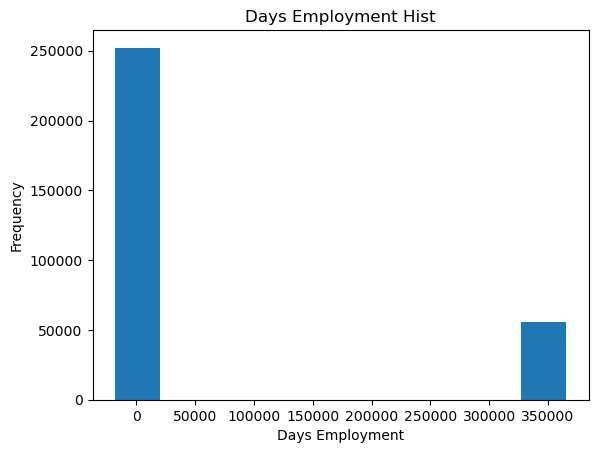

In [20]:
# Plot histogram of DAYS_EMPLOYED
df_application_train['DAYS_EMPLOYED'].plot.hist(title='Days Employment Hist')
plt.xlabel('Days Employment')
plt.show()

In [21]:
df_application_train['DAYS_EMPLOYED'].value_counts()[:1]

DAYS_EMPLOYED
365243    55374
Name: count, dtype: int64

In [22]:
# Separate anomalies and non-anomalies
anom = df_application_train[df_application_train['DAYS_EMPLOYED'] == 365243]
non_anom = df_application_train[df_application_train['DAYS_EMPLOYED'] != 365243]


In [23]:
# Calculate the default rate for anomalies and non-anomalies
print('The non-anomalies default on %0.2f%% of loans' % (100 * non_anom['TARGET'].mean()))
print('The anomalies default on %0.2f%% of loans' % (100 * anom['TARGET'].mean()))
print('There are %d anomalous days of employment' % len(anom))

The non-anomalies default on 8.66% of loans
The anomalies default on 5.40% of loans
There are 55374 anomalous days of employment


In [24]:
# Create an anomalous flag column
df_application_train['DAYS_EMPLOYED_ANOM'] = df_application_train['DAYS_EMPLOYED'] == 365243


In [25]:
df_application_train['DAYS_EMPLOYED_ANOM'].value_counts()

DAYS_EMPLOYED_ANOM
False    252137
True      55374
Name: count, dtype: int64

In [26]:
# Replace the anomalous values with NaN
df_application_train['DAYS_EMPLOYED'].replace({365243: np.nan}, inplace=True)


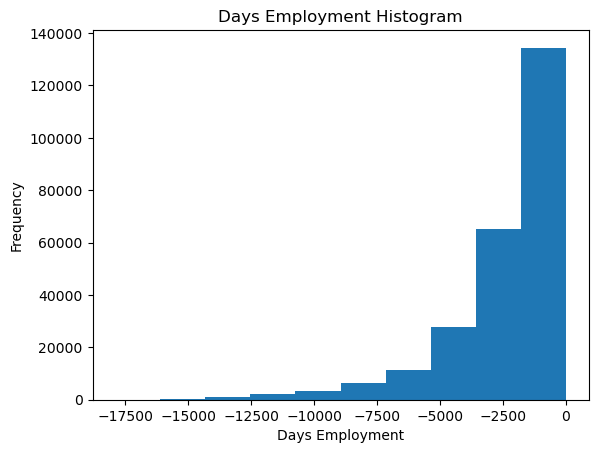

In [27]:
# Plot histogram of DAYS_EMPLOYED after replacing anomalies
df_application_train['DAYS_EMPLOYED'].plot.hist(title='Days Employment Histogram')
plt.xlabel('Days Employment')
plt.show()

In [28]:
df_application_train['DAYS_EMPLOYED'].value_counts()

DAYS_EMPLOYED
-200.0      156
-224.0      152
-199.0      151
-230.0      151
-212.0      150
           ... 
-13961.0      1
-11827.0      1
-10176.0      1
-9459.0       1
-8694.0       1
Name: count, Length: 12573, dtype: int64

In [29]:
# Process test data for anomalies
df_application_test['DAYS_EMPLOYED_ANOM'] = df_application_test['DAYS_EMPLOYED'] == 365243
df_application_test['DAYS_EMPLOYED'].replace({365243: np.nan}, inplace=True)


In [30]:
# Count anomalies in the test data
print('There are %d anomalies in the test data out of %d entries' % (df_application_test['DAYS_EMPLOYED_ANOM'].sum(), len(df_application_test)))

There are 9274 anomalies in the test data out of 48744 entries


In [31]:
# Find correlations with the target and sort
correlations = df_application_train.corr()['TARGET'].sort_values()

# Display correlations
print('Most Positive Correlations:\n', correlations.tail(20))
print('\nMost Negative Correlations:\n', correlations.head(20))

Most Positive Correlations:
 DEF_60_CNT_SOCIAL_CIRCLE                             0.031276
DEF_30_CNT_SOCIAL_CIRCLE                             0.032248
LIVE_CITY_NOT_WORK_CITY                              0.032518
OWN_CAR_AGE                                          0.037612
DAYS_REGISTRATION                                    0.041975
OCCUPATION_TYPE_Laborers                             0.043019
FLAG_DOCUMENT_3                                      0.044346
REG_CITY_NOT_LIVE_CITY                               0.044395
FLAG_EMP_PHONE                                       0.045982
NAME_EDUCATION_TYPE_Secondary / secondary special    0.049824
REG_CITY_NOT_WORK_CITY                               0.050994
DAYS_ID_PUBLISH                                      0.051457
CODE_GENDER_M                                        0.054713
DAYS_LAST_PHONE_CHANGE                               0.055218
NAME_INCOME_TYPE_Working                             0.057481
REGION_RATING_CLIENT                     

The 'DAYS_EMPLOYED' column represents how many days before the loan application the person started their current employment. Negative values mean the person was already employed when applying for the loan. We found a positive correlation between 'DAYS_EMPLOYED' and the 'TARGET' variable, suggesting that longer employment periods at the time of application are associated with a higher likelihood of on-time loan repayment, while newly employed applicants tend to have difficulty repaying on time. This highlights the importance of considering an applicant's employment history in predicting loan repayment.

**Age (DAYS_BIRTH):**
The 'DAYS_BIRTH' column represents the age of the applicants in days, with negative values indicating younger applicants. To avoid any misleading correlations, we took the absolute values of 'DAYS_BIRTH.' Contrary to our initial expectation, we observed a negative correlation between age and loan repayment. In other words, older applicants are more likely to repay their loans on time. This negative correlation suggests that age may play a significant role in assessing an applicant's creditworthiness, with older individuals being perceived as less risky borrowers.



In [32]:
# Find the correlation of the positive days since birth and target
df_application_train['DAYS_BIRTH'] = abs(df_application_train['DAYS_BIRTH'])
df_application_train['DAYS_BIRTH'].corr(df_application_train['TARGET'])


-0.07823930830982694

In [33]:
df_application_test['DAYS_BIRTH'] = abs(df_application_test['DAYS_BIRTH'])


Text(0, 0.5, 'Count')

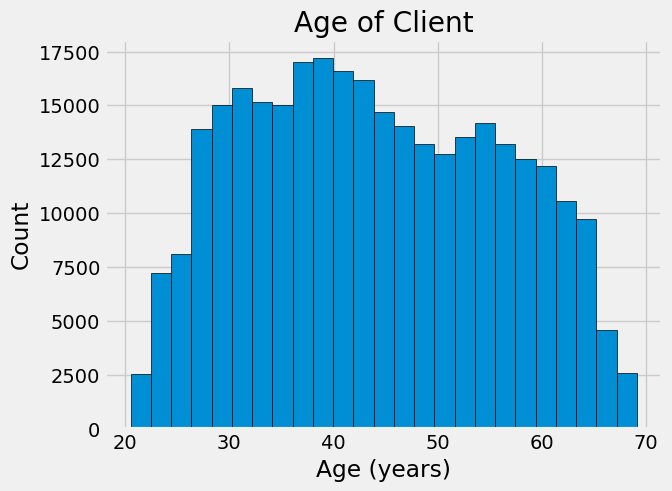

In [34]:
# Set the style of plots
plt.style.use('fivethirtyeight')

# Plot the distribution of ages in years
plt.hist(df_application_train['DAYS_BIRTH'] / 365, edgecolor='k', bins=25)
plt.title('Age of Client')
plt.xlabel('Age (years)')
plt.ylabel('Count')


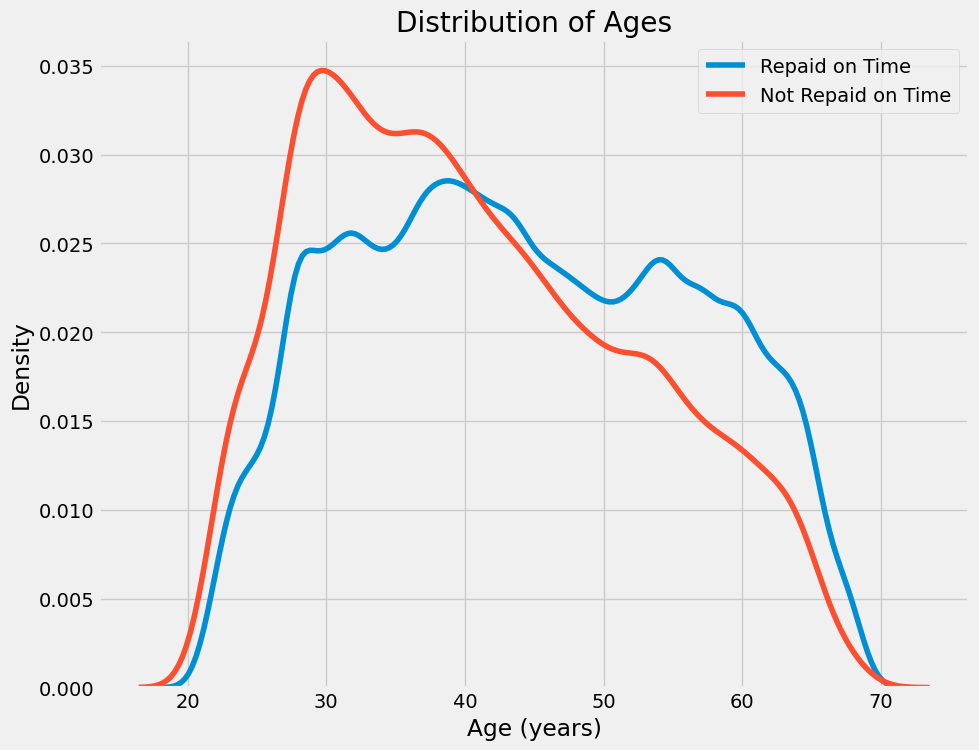

In [35]:
# Create a figure
plt.figure(figsize=(10, 8))

# KDE plot of loans that were repaid on time
sns.kdeplot(df_application_train.loc[df_application_train['TARGET'] == 0, 'DAYS_BIRTH'] / 365, label='Repaid on Time')

# KDE plot of loans which were not repaid on time
sns.kdeplot(df_application_train.loc[df_application_train['TARGET'] == 1, 'DAYS_BIRTH'] / 365, label='Not Repaid on Time')

# Labeling of plot
plt.xlabel('Age (years)')
plt.ylabel('Density')
plt.title('Distribution of Ages')

# Add legend
plt.legend()

# Show the plot
plt.show()


In [36]:
# Create a new DataFrame for age information
age_data = df_application_train[['TARGET', 'DAYS_BIRTH']]
age_data['YEARS_BIRTH'] = age_data['DAYS_BIRTH'] / 365

# Define bins for age
age_bins = np.linspace(20, 70, num=11)

# Bin the age data using the specified bins
age_data['YEARS_BINNED'] = pd.cut(age_data['YEARS_BIRTH'], bins=age_bins)

# Display the first 10 rows of the age data
age_data.head(10)

,TARGET,DAYS_BIRTH,YEARS_BIRTH,YEARS_BINNED
0,1,9461,25.920548,"(25.0, 30.0]"
1,0,16765,45.931507,"(45.0, 50.0]"
2,0,19046,52.180822,"(50.0, 55.0]"
3,0,19005,52.068493,"(50.0, 55.0]"
4,0,19932,54.608219,"(50.0, 55.0]"
5,0,16941,46.413699,"(45.0, 50.0]"
6,0,13778,37.747945,"(35.0, 40.0]"
7,0,18850,51.643836,"(50.0, 55.0]"
8,0,20099,55.065753,"(55.0, 60.0]"
9,0,14469,39.641096,"(35.0, 40.0]"


In [37]:
# Group by the age bins and calculate averages
age_groups = age_data.groupby('YEARS_BINNED').mean()

# Display the resulting DataFrame
age_groups

/var/folders/bs/1d8rfzxx5wj67r7yvcktcqmr0000gn/T/ipykernel_34641/582202543.py:2: FutureWarning:

The default of observed=False is deprecated and will be changed to True in a future version of pandas. Pass observed=False to retain current behavior or observed=True to adopt the future default and silence this warning.



,TARGET,DAYS_BIRTH,YEARS_BIRTH
YEARS_BINNED,,,
"(20.0, 25.0]",0.123036,8532.795625,23.377522
"(25.0, 30.0]",0.111436,10155.219250,27.822518
"(30.0, 35.0]",0.102814,11854.848377,32.479037
"(35.0, 40.0]",0.089414,13707.908253,37.555913
"(40.0, 45.0]",0.078491,15497.661233,42.459346
"(45.0, 50.0]",0.074171,17323.900441,47.462741
"(50.0, 55.0]",0.066968,19196.494791,52.593136
"(55.0, 60.0]",0.055314,20984.262742,57.491131
"(60.0, 65.0]",0.052737,22780.547460,62.412459


We've grouped borrowers into age bins and calculated the average loan repayment behavior, average age in days, and average age in years for each group. This analysis helps us explore potential connections between borrowers' ages and their ability to repay loans in the context of the Home Credit Default Risk Prediction project.






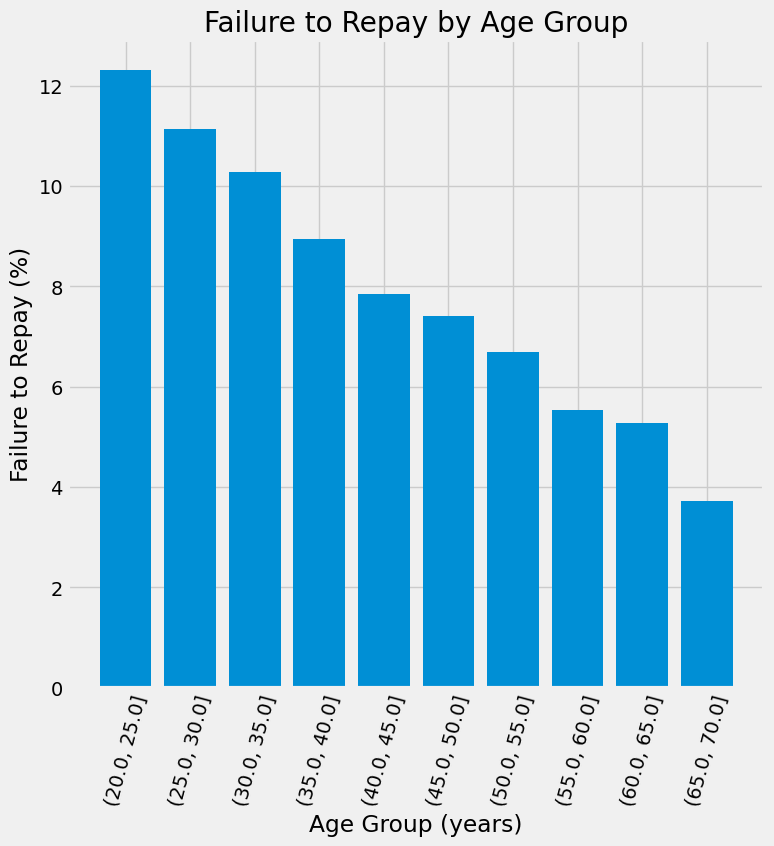

In [38]:
plt.figure(figsize=(8, 8))

# Create a bar plot of age groups and the average of the target
plt.bar(age_groups.index.astype(str), 100 * age_groups['TARGET'])

# Plot labeling
plt.xticks(rotation=75)
plt.xlabel('Age Group (years)')
plt.ylabel('Failure to Repay (%)')
plt.title('Failure to Repay by Age Group')

# Show the plot
plt.show()

In [39]:
# Extract the relevant columns
ext_data = df_application_train[['TARGET', 'EXT_SOURCE_1', 'EXT_SOURCE_2', 'EXT_SOURCE_3', 'DAYS_BIRTH', 'DAYS_EMPLOYED']]

# Calculate the correlations
ext_data_corrs = ext_data.corr()

# Display the correlation matrix
ext_data_corrs


,TARGET,EXT_SOURCE_1,EXT_SOURCE_2,EXT_SOURCE_3,DAYS_BIRTH,DAYS_EMPLOYED
TARGET,1.000000,-0.155317,-0.160472,-0.178919,-0.078239,0.074958
EXT_SOURCE_1,-0.155317,1.000000,0.213982,0.186846,0.600610,-0.252712
EXT_SOURCE_2,-0.160472,0.213982,1.000000,0.109167,0.091996,-0.093444
EXT_SOURCE_3,-0.178919,0.186846,0.109167,1.000000,0.205478,-0.129722
DAYS_BIRTH,-0.078239,0.600610,0.091996,0.205478,1.000000,-0.352321
DAYS_EMPLOYED,0.074958,-0.252712,-0.093444,-0.129722,-0.352321,1.000000


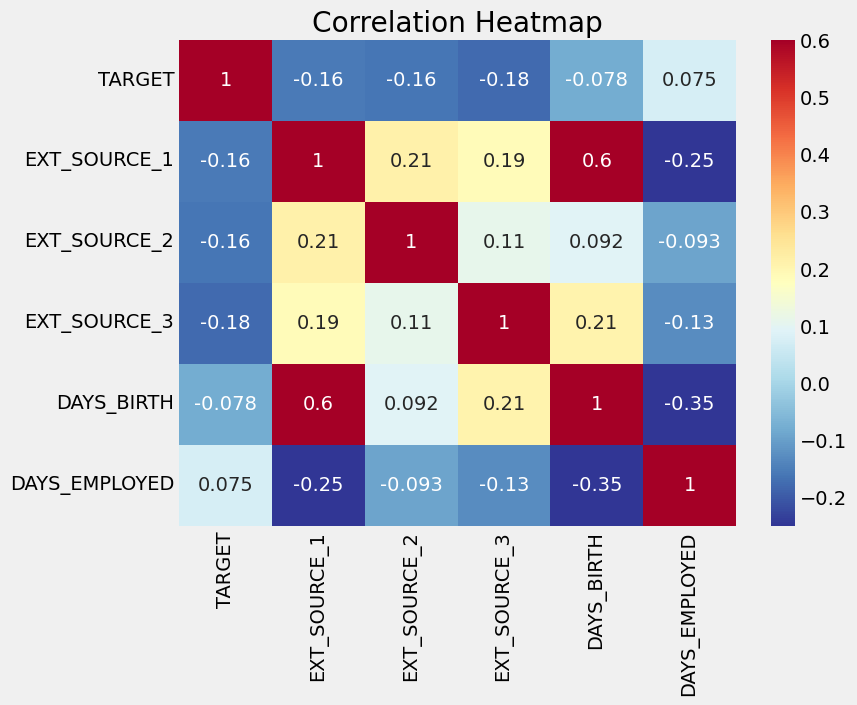

In [40]:

plt.figure(figsize=(8, 6))

# Create a heatmap of correlations
sns.heatmap(ext_data_corrs, cmap=plt.cm.RdYlBu_r, vmin=-0.25, annot=True, vmax=0.6)

# Set the title
plt.title('Correlation Heatmap')

# Show the plot
plt.show()

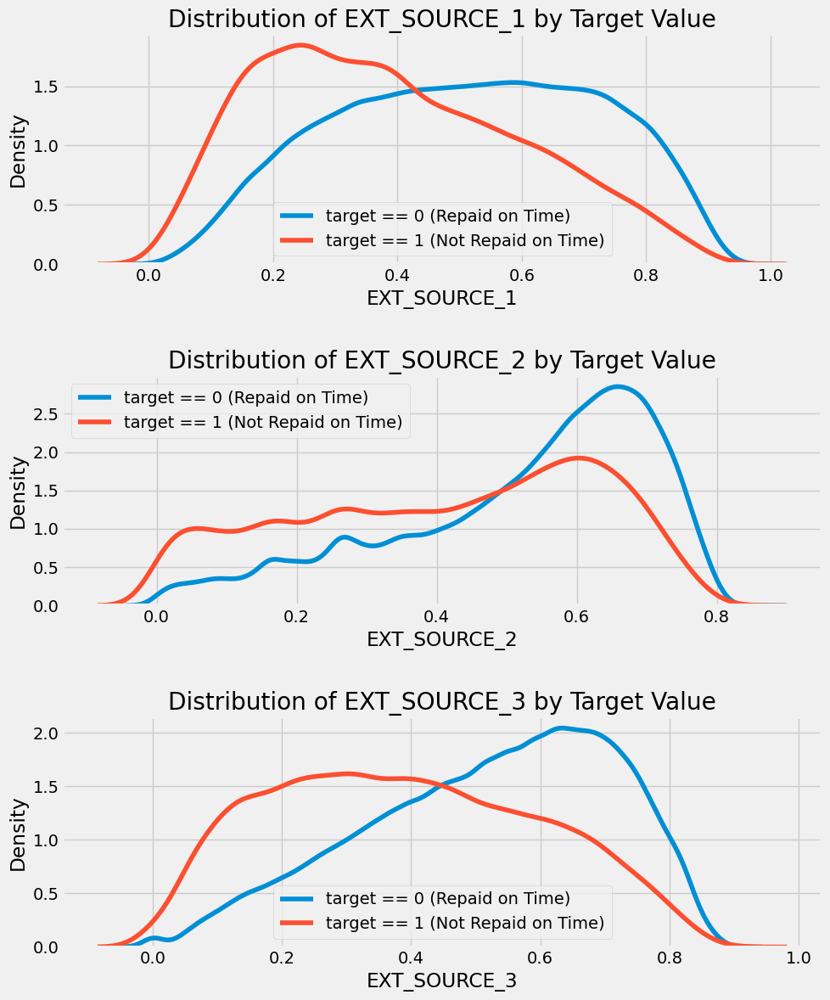

In [41]:
# Create a figure with subplots
fig, axes = plt.subplots(3, 1, figsize=(10, 12))

# List of EXT_SOURCE variables
ext_sources = ['EXT_SOURCE_1', 'EXT_SOURCE_2', 'EXT_SOURCE_3']

# Iterate through the sources and plot
for i, source in enumerate(ext_sources):
    # Plot repaid loans
    sns.kdeplot(df_application_train.loc[df_application_train['TARGET'] == 0, source], label='target == 0 (Repaid on Time)', ax=axes[i])
    # Plot loans that were not repaid
    sns.kdeplot(df_application_train.loc[df_application_train['TARGET'] == 1, source], label='target == 1 (Not Repaid on Time)', ax=axes[i])
    
    # Label the plots
    axes[i].set_title(f'Distribution of {source} by Target Value')
    axes[i].set_xlabel(source)
    axes[i].set_ylabel('Density')
    axes[i].legend()  # Add legend

# Adjust subplot spacing
plt.tight_layout(h_pad=2.5)

# Show the subplots
plt.show()


The columns EXT_SOURCE_1, EXT_SOURCE_2, and EXT_SOURCE_3 represent normalized scores obtained from external data sources. These scores are indicative of an applicant's creditworthiness and are important features for our project. A higher value of these scores suggests a lower credit risk, meaning the applicant is more likely to repay the loan on time. The negative correlation with the target column implies that as these scores increase, the likelihood of repayment also increases, aligning with our expectation. Therefore, these external data sources are valuable predictors for our machine learning model in assessing loan repayment risk.

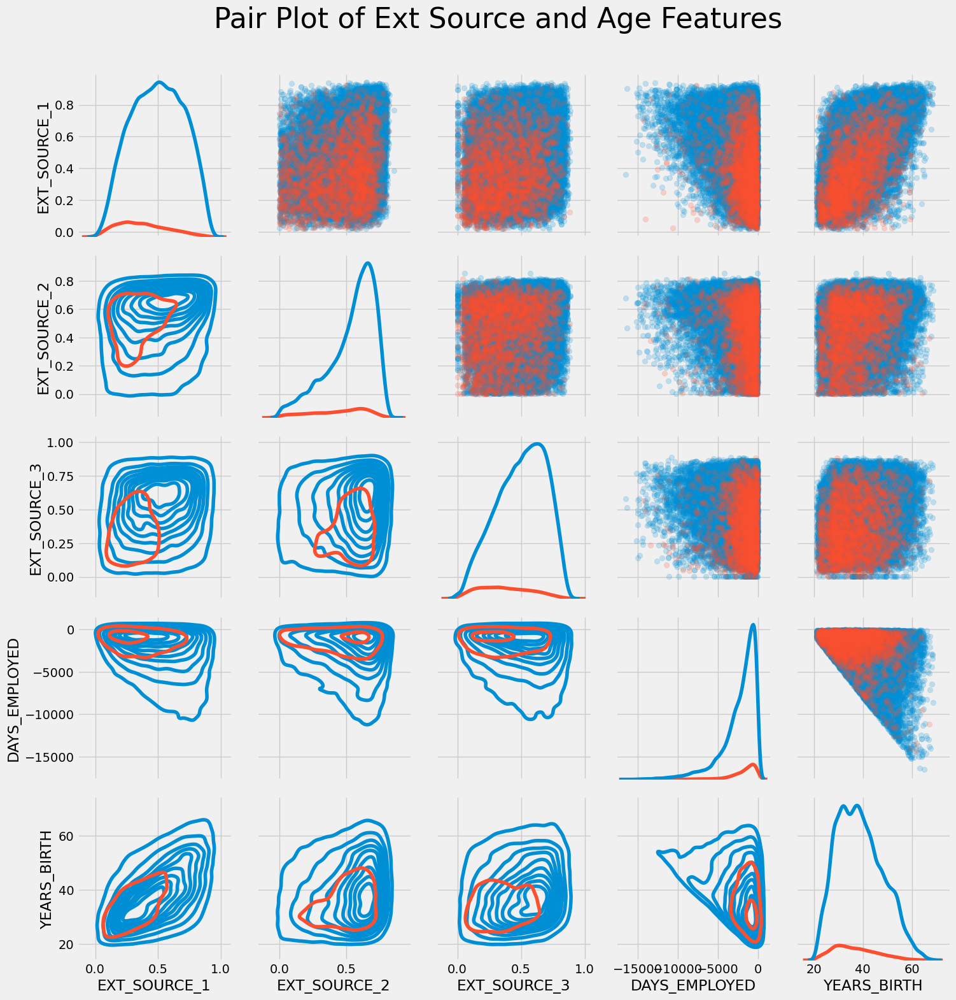

In [42]:
# Copy the data for plotting
plot_data = ext_data.drop(columns=['DAYS_BIRTH']).copy()

# Add in the age of the client in years
plot_data['YEARS_BIRTH'] = age_data['YEARS_BIRTH']

# Drop NA values and limit to the first 100,000 rows
plot_data = plot_data.dropna().loc[:100000, :]

# Define a function to calculate the correlation coefficient between two columns
def calculate_correlation(x, y, **kwargs):
    correlation = np.corrcoef(x, y)[0][1]
    ax = plt.gca()
    ax.annotate("Correlation = {:.2f}".format(correlation),
                xy=(.2, .8), xycoords=ax.transAxes,
                size=20)

# Create a PairGrid object
grid = sns.PairGrid(data=plot_data, height=3, diag_sharey=False,
                    hue='TARGET', 
                    vars=[x for x in plot_data.columns if x != 'TARGET'])

# Upper part: Scatter plots
grid.map_upper(plt.scatter, alpha=0.2)

# Diagonal: Histograms
grid.map_diag(sns.kdeplot)

# Lower part: Density plots
grid.map_lower(sns.kdeplot)

# Set the plot title
plt.suptitle('Pair Plot of Ext Source and Age Features', size=32, y=1.05)

# Show the plot
plt.show()


One notable observation is a moderate positive linear relationship between "EXT_SOURCE_1" and "YEARS_BIRTH" (or equivalently "DAYS_BIRTH"). This suggests that "EXT_SOURCE_1" might take into account the age of the client. As "EXT_SOURCE_1" increases, indicating a more favorable external source score, the age of the client tends to be higher. This relationship could imply that older clients may have more favorable external scores, which could influence their ability to repay loans on time. However, it's essential to note that this is just one aspect of the complex relationships within the data, and further analysis is needed to fully understand the predictive power of these features in the context of loan default risk

### APP_POLY

In [43]:
from sklearn.impute import SimpleImputer
from sklearn.preprocessing import PolynomialFeatures

# Select the columns for polynomial features
selected_columns = ['EXT_SOURCE_1', 'EXT_SOURCE_2', 'EXT_SOURCE_3', 'DAYS_BIRTH', 'TARGET']
poly_features = df_application_train[selected_columns]

# Separate the target variable
poly_target = poly_features['TARGET']

# Drop the target variable from the feature set
poly_features = poly_features.drop(columns=['TARGET'])

# Create an instance of SimpleImputer with the median strategy
imputer = SimpleImputer(strategy='median')

# Impute missing values in both the training and test sets
poly_features = imputer.fit_transform(poly_features)

# Apply the same imputer to the test data
poly_features_test = df_application_test[selected_columns[:-1]]  # Remove 'TARGET' from the test data

# Impute missing values in the test data
poly_features_test = imputer.transform(poly_features_test)

# Create a PolynomialFeatures object with the desired degree (e.g., degree = 3)
poly_transformer = PolynomialFeatures(degree=3)


In [44]:
# Train the polynomial features
poly_transformer.fit(poly_features)

# Transform the features
poly_features = poly_transformer.transform(poly_features)
poly_features_test = poly_transformer.transform(poly_features_test)

# Print the shape of the polynomial features
print('Polynomial Features shape:', poly_features.shape)

Polynomial Features shape: (307511, 35)


In [45]:
# Get the feature names of the polynomial features
poly_feature_names = poly_transformer.get_feature_names_out(input_features=['EXT_SOURCE_1', 'EXT_SOURCE_2', 'EXT_SOURCE_3', 'DAYS_BIRTH'])

# Create a dataframe of the features 
poly_features = pd.DataFrame(poly_features, columns=poly_feature_names)

# Add in the target
poly_features['TARGET'] = poly_target

# Find the correlations with the target
poly_corrs = poly_features.corr()['TARGET'].sort_values()

# Display most negative and most positive correlations
print(poly_corrs.head(10))
print(poly_corrs.tail(5))

EXT_SOURCE_2 EXT_SOURCE_3                -0.193939
EXT_SOURCE_1 EXT_SOURCE_2 EXT_SOURCE_3   -0.189605
EXT_SOURCE_2 EXT_SOURCE_3 DAYS_BIRTH     -0.181283
EXT_SOURCE_2^2 EXT_SOURCE_3              -0.176428
EXT_SOURCE_2 EXT_SOURCE_3^2              -0.172282
EXT_SOURCE_1 EXT_SOURCE_2                -0.166625
EXT_SOURCE_1 EXT_SOURCE_3                -0.164065
EXT_SOURCE_2                             -0.160295
EXT_SOURCE_2 DAYS_BIRTH                  -0.156873
EXT_SOURCE_1 EXT_SOURCE_2^2              -0.156867
Name: TARGET, dtype: float64
DAYS_BIRTH     -0.078239
DAYS_BIRTH^2   -0.076672
DAYS_BIRTH^3   -0.074273
TARGET          1.000000
1                    NaN
Name: TARGET, dtype: float64


The new columns created through polynomial transformations, combining external data source scores and age, hold significant predictive power for the project. These features capture complex interactions and non-linear relationships, providing a more nuanced understanding of how external data and age influence loan repayment. Their strong negative correlations with the target variable make them crucial for improving predictive accuracy in machine learning models. In essence, these features enhance the project's ability to distinguish between applicants who are likely to repay loans on time and those who may encounter difficulties, ultimately contributing to the project's success.

In [46]:
# Put test features into a dataframe
poly_features_test = pd.DataFrame(poly_features_test, columns=poly_feature_names)

# Merge polynomial features into the training dataframe
poly_features['SK_ID_CURR'] = df_application_train['SK_ID_CURR']
app_train_poly = df_application_train.merge(poly_features, on='SK_ID_CURR', how='left')

# Merge polynomial features into the testing dataframe
poly_features_test['SK_ID_CURR'] = df_application_test['SK_ID_CURR']
app_test_poly = df_application_test.merge(poly_features_test, on='SK_ID_CURR', how='left')

# Align the dataframes
app_train_poly, app_test_poly = app_train_poly.align(app_test_poly, join='inner', axis=1)

# Print out the new shapes
print('Training data with polynomial features shape:', app_train_poly.shape)
print('Testing data with polynomial features shape:', app_test_poly.shape)

Training data with polynomial features shape: (307511, 275)
Testing data with polynomial features shape: (48744, 275)


### APP_DOMAIN

In [47]:
# Create copies of the training and testing dataframes
app_train_domain = df_application_train.copy()
app_test_domain = df_application_test.copy()

# Financial ratios in the training dataframe
app_train_domain['CREDIT_INCOME_PERCENT'] = app_train_domain['AMT_CREDIT'] / app_train_domain['AMT_INCOME_TOTAL']
app_train_domain['ANNUITY_INCOME_PERCENT'] = app_train_domain['AMT_ANNUITY'] / app_train_domain['AMT_INCOME_TOTAL']
app_train_domain['CREDIT_TERM'] = app_train_domain['AMT_ANNUITY'] / app_train_domain['AMT_CREDIT']

# Employment-related percentage in the training dataframe
app_train_domain['DAYS_EMPLOYED_PERCENT'] = app_train_domain['DAYS_EMPLOYED'] / app_train_domain['DAYS_BIRTH']

# Financial ratios in the testing dataframe
app_test_domain['CREDIT_INCOME_PERCENT'] = app_test_domain['AMT_CREDIT'] / app_test_domain['AMT_INCOME_TOTAL']
app_test_domain['ANNUITY_INCOME_PERCENT'] = app_test_domain['AMT_ANNUITY'] / app_test_domain['AMT_INCOME_TOTAL']
app_test_domain['CREDIT_TERM'] = app_test_domain['AMT_ANNUITY'] / app_test_domain['AMT_CREDIT']

# Employment-related percentage in the testing dataframe
app_test_domain['DAYS_EMPLOYED_PERCENT'] = app_test_domain['DAYS_EMPLOYED'] / app_test_domain['DAYS_BIRTH']

In [48]:
# Print out the new shapes
print('Training data with polynomial features shape:', app_train_domain.shape)
print('Testing data with polynomial features shape:', app_test_domain.shape)

Training data with polynomial features shape: (307511, 245)
Testing data with polynomial features shape: (48744, 244)


The feature engineering performed in this section involves creating new informative features by calculating financial ratios and employment-related percentages for both the training and testing datasets. These features, including CREDIT_INCOME_PERCENT, ANNUITY_INCOME_PERCENT, CREDIT_TERM, and DAYS_EMPLOYED_PERCENT, provide valuable insights into an applicant's financial capacity, loan repayment behavior, and employment history. They serve to enhance the interpretability and predictive power of the machine learning model, contributing to a more comprehensive analysis of Home Credit default risk. These newly engineered columns are incorporated into a separate dataset, app_train_domain for the training data and app_test_domain for the testing data, enriching the dataset with valuable information for model training and evaluation.

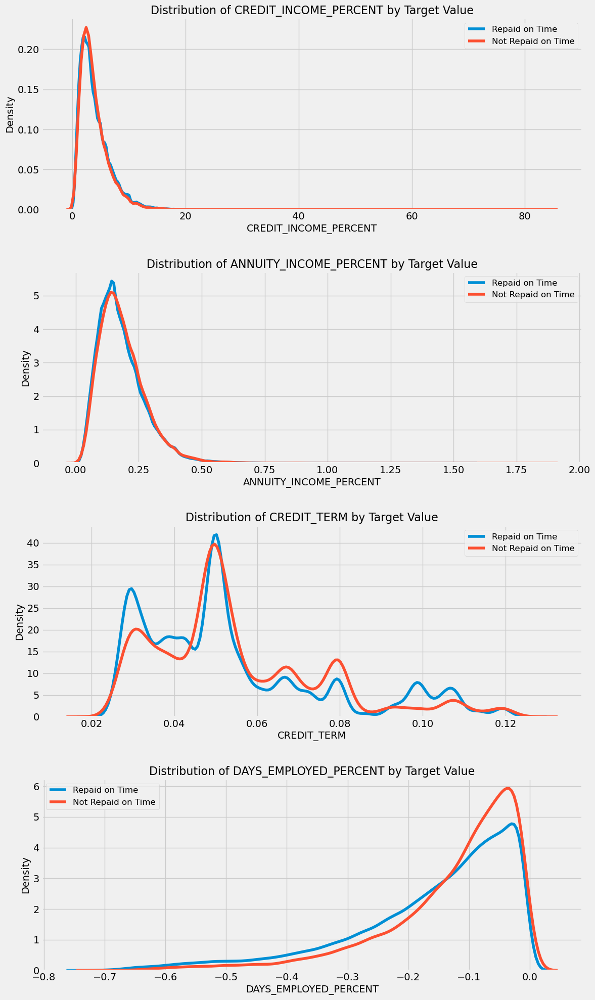

In [49]:
plt.figure(figsize=(12, 20))

# Define legends for TARGET values
target_legends = {0: 'Repaid on Time', 1: 'Not Repaid on Time'}

# Iterate through the new features
for i, feature in enumerate(['CREDIT_INCOME_PERCENT', 'ANNUITY_INCOME_PERCENT', 'CREDIT_TERM', 'DAYS_EMPLOYED_PERCENT']):
    
    # Create a new subplot for each feature
    plt.subplot(4, 1, i + 1)
    
    # Plot repaid loans
    sns.kdeplot(app_train_domain.loc[app_train_domain['TARGET'] == 0, feature], label=target_legends[0])
    
    # Plot loans that were not repaid
    sns.kdeplot(app_train_domain.loc[app_train_domain['TARGET'] == 1, feature], label=target_legends[1])
    
    # Label the plots
    plt.title('Distribution of %s by Target Value' % feature, fontsize=16)
    plt.xlabel('%s' % feature, fontsize=14)
    plt.ylabel('Density', fontsize=14)
    plt.legend(fontsize=12)  # Increase legend font size
    
plt.tight_layout(h_pad=2.5)


**CREDIT_INCOME_PERCENT:** This column represents the ratio of the loan amount (AMT_CREDIT) to the client's total income (AMT_INCOME_TOTAL). It provides insights into the portion of a client's income dedicated to covering the loan, indicating their financial capacity. A higher value suggests a larger proportion of income allocated to repayments, which might be a risk factor if it's too high.

**ANNUITY_INCOME_PERCENT:** This feature calculates the ratio of the loan annuity (AMT_ANNUITY) to the client's total income (AMT_INCOME_TOTAL). It helps assess the affordability of the loan, as it reveals the percentage of the client's income required to meet the annuity payments. Higher values indicate a larger portion of income dedicated to loan annuities, potentially affecting the client's financial stability.

**CREDIT_TERM:** This column measures the ratio of the loan annuity (AMT_ANNUITY) to the credit amount (AMT_CREDIT). It provides information about the duration of the loan in terms of annuity payments. A higher value suggests longer repayment terms, which could impact the client's financial planning and ability to repay.

**DAYS_EMPLOYED_PERCENT:** This feature calculates the percentage of the client's working days (DAYS_EMPLOYED) relative to their age in days (DAYS_BIRTH). It assesses the stability of the client's employment history. A higher percentage implies more time spent employed relative to their age, indicating a potentially more stable source of income.

## Test-Train Split

In [50]:
from sklearn.model_selection import train_test_split
from sklearn.impute import SimpleImputer
from sklearn.preprocessing import MinMaxScaler

# Drop the target from the training data
if 'TARGET' in df_application_train:
    train = df_application_train.drop(columns=['TARGET'])
else:
    train = app_train.copy()

X = train
y = train_labels

# Calculate the correlation between features and target
correlations = X.corrwith(y)

# Sort features by absolute correlation values in descending order
correlations = correlations.abs().sort_values(ascending=False)

# Select the top 50 correlated features
selected_features = correlations.index[:50]

# Use only the selected features
X = X[selected_features]

X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=0.2, random_state=101)

# Create an instance of SimpleImputer with the median strategy
imputer = SimpleImputer(strategy='median')

# Scale each feature to 0-1
scaler = MinMaxScaler(feature_range=(0, 1))

# Fit on the training data
imputer.fit(X_train)

# Transform both training and testing data
train = imputer.transform(X_train)
test = imputer.transform(X_test)

# Repeat with the scaler
scaler.fit(train)
train = scaler.transform(train)
test = scaler.transform(test)

print('Training data shape: ', train.shape)
print('Testing data shape: ', test.shape)


Training data shape:  (246008, 50)
Testing data shape:  (61503, 50)


In [51]:
import mlflow
mlflow.set_tracking_uri("sqlite:///mlflow.db")
mlflow.create_experiment("Credit")
mlflow.set_experiment("Credit")

/Users/ismailcanoguz/opt/anaconda3/envs/can/lib/python3.9/site-packages/mlflow/utils/requirements_utils.py:20: DeprecationWarning:

pkg_resources is deprecated as an API. See https://setuptools.pypa.io/en/latest/pkg_resources.html

/Users/ismailcanoguz/opt/anaconda3/envs/can/lib/python3.9/site-packages/pkg_resources/__init__.py:2871: DeprecationWarning:

Deprecated call to `pkg_resources.declare_namespace('google')`.
Implementing implicit namespace packages (as specified in PEP 420) is preferred to `pkg_resources.declare_namespace`. See https://setuptools.pypa.io/en/latest/references/keywords.html#keyword-namespace-packages



<Experiment: artifact_location='/Users/ismailcanoguz/Desktop/project6/mlruns/1', creation_time=1699974908885, experiment_id='1', last_update_time=1699974908885, lifecycle_stage='active', name='Credit', tags={}>

In [52]:
from sklearn.metrics import accuracy_score, precision_score, recall_score, f1_score, roc_auc_score, fbeta_score, average_precision_score, matthews_corrcoef
import mlflow.sklearn
import warnings

def evaluate_classifier(model, train, y_train, test, y_test, model_name):
    mlflow.sklearn.autolog(disable=True)
    warnings.filterwarnings("ignore", category=UserWarning, module="_distutils_hack")

    with mlflow.start_run(run_name=model_name):
        model.fit(train, y_train)

        # Predictions and probabilities for both train and test
        train_preds = model.predict(train)
        train_probs = model.predict_proba(train)[:, 1]
        test_preds = model.predict(test)
        test_probs = model.predict_proba(test)[:, 1]

        # Calculate metrics for training set
        train_accuracy = accuracy_score(y_train, train_preds)
        train_precision = precision_score(y_train, train_preds)
        train_recall = recall_score(y_train, train_preds)
        train_f1 = f1_score(y_train, train_preds)
        train_auc = roc_auc_score(y_train, train_probs)
        train_fbeta = fbeta_score(y_train, train_preds, beta=2, average='weighted')
        train_avg_precision = average_precision_score(y_train, train_probs)
        train_mcc = matthews_corrcoef(y_train, train_preds)

        # Calculate metrics for test set
        test_accuracy = accuracy_score(y_test, test_preds)
        test_precision = precision_score(y_test, test_preds)
        test_recall = recall_score(y_test, test_preds)
        test_f1 = f1_score(y_test, test_preds)
        test_auc = roc_auc_score(y_test, test_probs)
        test_fbeta = fbeta_score(y_test, test_preds, beta=2, average='weighted')
        test_avg_precision = average_precision_score(y_test, test_probs)
        test_mcc = matthews_corrcoef(y_test, test_preds)

        # Log training metrics
        mlflow.log_metric("Train Accuracy", train_accuracy)
        mlflow.log_metric("Train Precision", train_precision)
        mlflow.log_metric("Train Recall", train_recall)
        mlflow.log_metric("Train F1-score", train_f1)
        mlflow.log_metric("Train AUC", train_auc)
        mlflow.log_metric("Train F2-score", train_fbeta)
        mlflow.log_metric("Train Average Precision", train_avg_precision)
        mlflow.log_metric("Train Matthews Correlation Coefficient", train_mcc)

        # Log test metrics
        mlflow.log_metric("Test Accuracy", test_accuracy)
        mlflow.log_metric("Test Precision", test_precision)
        mlflow.log_metric("Test Recall", test_recall)
        mlflow.log_metric("Test F1-score", test_f1)
        mlflow.log_metric("Test AUC", test_auc)
        mlflow.log_metric("Test F2-score", test_fbeta)
        mlflow.log_metric("Test Average Precision", test_avg_precision)
        mlflow.log_metric("Test Matthews Correlation Coefficient", test_mcc)

        # Log the model
        mlflow.sklearn.log_model(model, "sk_models")

    # Reset warning filters at the end if needed
    warnings.resetwarnings()

    return test_preds, test_probs

# Dummy Classfier

In [53]:
from sklearn.dummy import DummyClassifier

dummy_classifier = DummyClassifier(strategy="stratified")
test_preds_dummy, test_probs_dummy = evaluate_classifier(dummy_classifier, train, y_train, test, y_test, "Dummy Classifier")

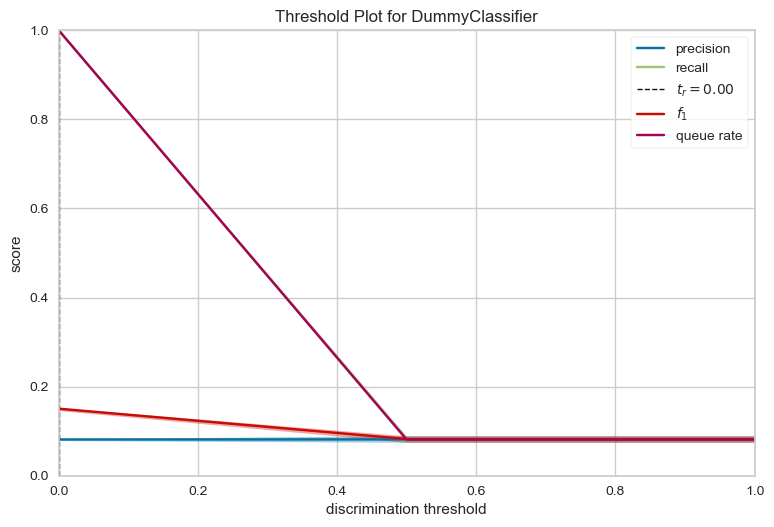

<Axes: title={'center': 'Threshold Plot for DummyClassifier'}, xlabel='discrimination threshold', ylabel='score'>

In [54]:
from yellowbrick.classifier import DiscriminationThreshold

# Create the DiscriminationThreshold visualizer with the Dummy Classifier
visualizer = DiscriminationThreshold(
    dummy_classifier,
    n_trials=50,
    argmax='recall',  
    random_state=101,
    is_fitted='auto'
)

# Fit the visualizer on the validation data
visualizer.fit(train, y_train)

# Score and display the visualization
visualizer.score(test, y_test)
visualizer.show()

In [55]:
from sklearn.metrics import confusion_matrix, classification_report
from matplotlib.font_manager import FontProperties

def visualize_confusion_matrix(conf_matrix, model_name="Model"):
    # Extract TP, TN, FP, FN
    tp = conf_matrix[1, 1]
    tn = conf_matrix[0, 0]
    fp = conf_matrix[0, 1]
    fn = conf_matrix[1, 0]

    # Create a 3x3 table with an empty (0,0) cell
    table_data = [
        [f"{model_name}", "Positive (1)", "Negative (0)"],
        ["Positive (1)", f"True Positive\n(TP)\n{tp}", f"False Positive\n(FP)\n{fp}"],
        ["Negative (0)", f"False Negative\n(FN)\n{fn}", f"True Negative\n(TN)\n{tn}"]
    ]

    fig, ax = plt.subplots(figsize=(8, 4))  # Adjust the figsize for wider cells
    ax.axis('off')  # Turn off the axis

    # Create the table with colored backgrounds and no lines
    table = ax.table(
        cellText=table_data,
        cellLoc='center',
        loc='center',
        cellColours=[['lightgray', 'none', 'none'], ['none', 'lightgreen', 'red'], ['none', 'red', 'lightgreen']],
    )
    table.auto_set_font_size(False)
    table.set_fontsize(12)  # Adjust the font size

    # Make the (0, 0) cell bold and adjust the size
    table[0, 0].get_text().set_fontweight('bold')
    table[0, 0].get_text().set_fontsize(16)

    # Adjust the cell width
    table.scale(1, 4.5)

    # Add labels for "Actual Values" and "Predicted Values" using fig.text
    fig.text(0.01, 0.45, "Predicted Values", va='center', rotation='vertical', fontsize=14)
    fig.text(0.65, 0.80, "Actual Values", ha='center', fontsize=14)

    plt.show()


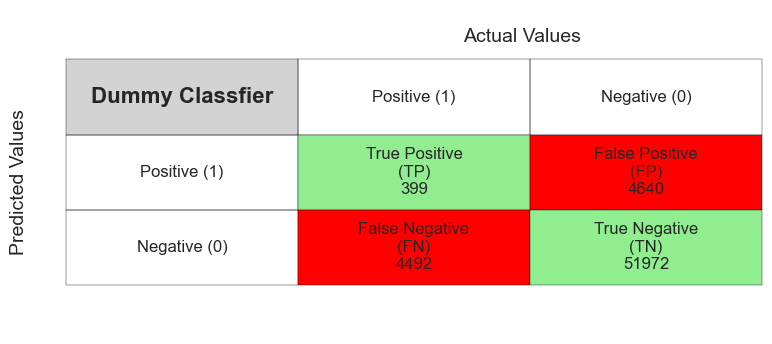

In [56]:
conf_matrix = confusion_matrix(y_test, test_preds_dummy)
visualize_confusion_matrix(conf_matrix, model_name='Dummy Classfier')

In [57]:
report = classification_report(y_test, test_preds_dummy)
print(report)

              precision    recall  f1-score   support

           0       0.92      0.92      0.92     56612
           1       0.08      0.08      0.08      4891

    accuracy                           0.85     61503
   macro avg       0.50      0.50      0.50     61503
weighted avg       0.85      0.85      0.85     61503



In [58]:
from sklearn.metrics import precision_recall_curve, average_precision_score
from sklearn.metrics import RocCurveDisplay


def plot_precision_recall_curve(model_name, y_test, y_pred_probs):
    # Calculate precision and recall values at different thresholds
    precision, recall, thresholds = precision_recall_curve(y_test, y_pred_probs)

    # Calculate the AUC-PR score
    auc_pr_score = average_precision_score(y_test, y_pred_probs)

    # Plot the Precision-Recall Curve
    plt.figure(figsize=(6, 4))
    plt.step(recall, precision, where='post')
    plt.xlabel('Recall')
    plt.ylabel('Precision')
    plt.title(f'Precision-Recall Curve ({model_name})\nAUC-PR = {auc_pr_score:.4f}')
    plt.xlim([0.0, 1.0])
    plt.ylim([0.0, 1.0])
    plt.grid(True)
    plt.show()

In [59]:
from sklearn.metrics import roc_curve, auc

def plot_roc_curve(model_name, y_test, y_pred_probs):
    # Calculate ROC curve
    fpr, tpr, thresholds = roc_curve(y_test, y_pred_probs)
    roc_auc = auc(fpr, tpr)

    # Plot the ROC Curve
    plt.figure()
    plt.plot(fpr, tpr, color='darkorange', lw=2, label='ROC curve (area = %0.2f)' % roc_auc)
    plt.plot([0, 1], [0, 1], color='navy', lw=2, linestyle='--')
    plt.xlim([0.0, 1.0])
    plt.ylim([0.0, 1.05])
    plt.xlabel('False Positive Rate')
    plt.ylabel('True Positive Rate')
    plt.title(f'ROC Curve ({model_name})')
    plt.legend(loc='lower right')
    plt.show()

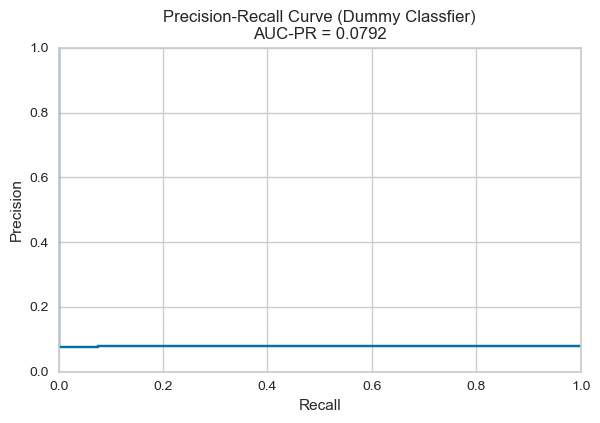

In [60]:
plot_precision_recall_curve("Dummy Classfier", y_test, test_probs_dummy)

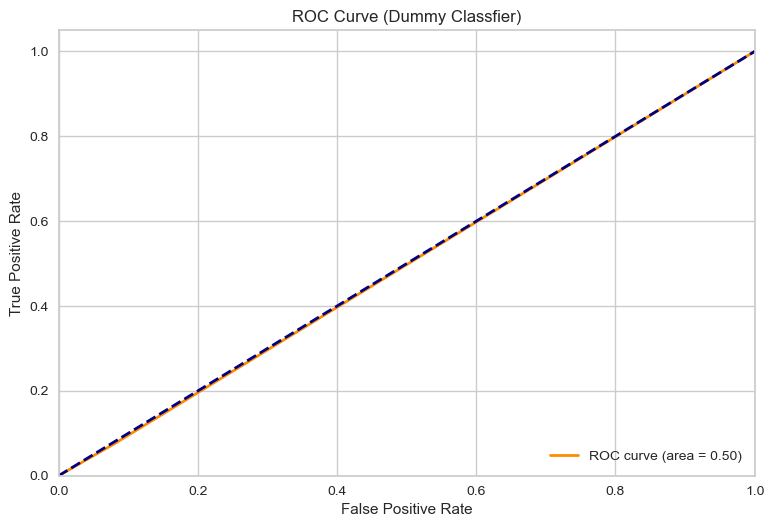

In [61]:
plot_roc_curve("Dummy Classfier", y_test, test_probs_dummy)

# Logistic Regression 

In [62]:
from sklearn.linear_model import LogisticRegression

# Create a Logistic Regression model without class weight
log_reg_no_weight = LogisticRegression(penalty='l1', C=0.1, solver='saga', max_iter=1000)
log_reg_no_weight.fit(train, y_train)

# Evaluate the Logistic Regression model without class weight
test_preds_lr, test_probs_lr = evaluate_classifier(log_reg_no_weight, train, y_train, test, y_test, "Logistic Regression (No Weight)")

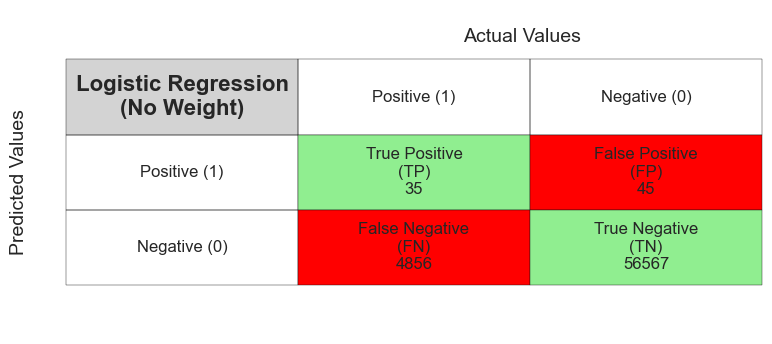

In [63]:
conf_matrix = confusion_matrix(y_test, test_preds_lr)
visualize_confusion_matrix(conf_matrix, model_name='Logistic Regression\n(No Weight)')

In [64]:
report = classification_report(y_test, test_preds_lr)
print(report)

              precision    recall  f1-score   support

           0       0.92      1.00      0.96     56612
           1       0.44      0.01      0.01      4891

    accuracy                           0.92     61503
   macro avg       0.68      0.50      0.49     61503
weighted avg       0.88      0.92      0.88     61503



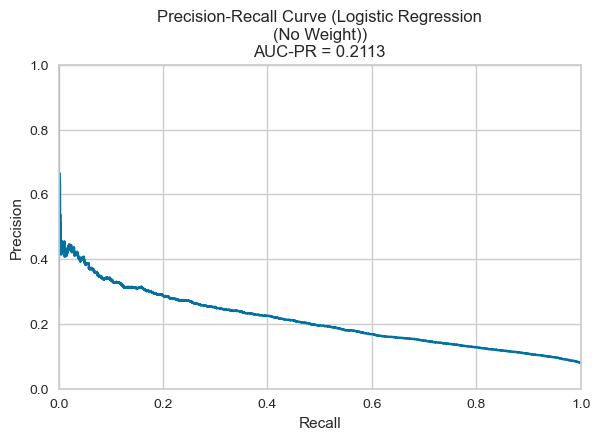

In [65]:
plot_precision_recall_curve("Logistic Regression\n(No Weight)", y_test, test_probs_lr)

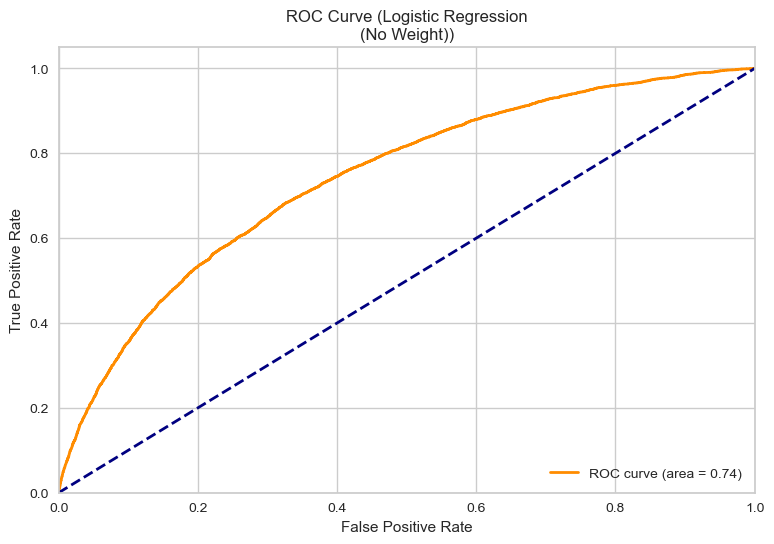

In [66]:
plot_roc_curve("Logistic Regression\n(No Weight)", y_test, test_probs_lr)

In [67]:
from sklearn.linear_model import LogisticRegression

# Create a Logistic Regression model with class weight 'balanced'
log_reg_with_weight = LogisticRegression(penalty='l1', C=0.1, solver='saga', max_iter=1000, class_weight='balanced')
log_reg_with_weight.fit(train, y_train)

# Evaluate the Logistic Regression model with class weight 'balanced'
test_preds_with_weight, test_probs_with_weight = evaluate_classifier(log_reg_with_weight, train, y_train, test, y_test, "Logistic Regression (Weighted)")

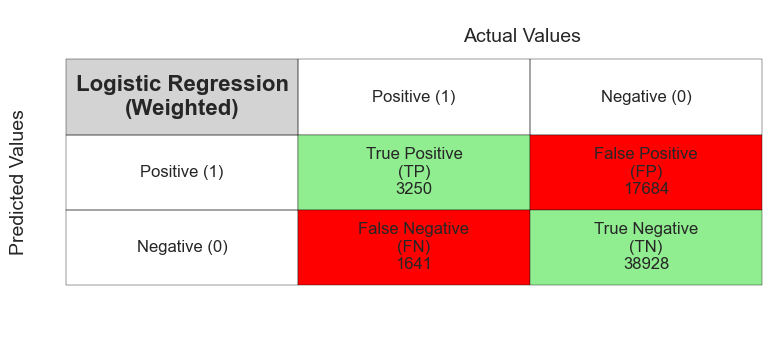

In [68]:
conf_matrix = confusion_matrix(y_test, test_preds_with_weight)
visualize_confusion_matrix(conf_matrix, model_name='Logistic Regression\n(Weighted)')

In [69]:
report = classification_report(y_test, test_preds_with_weight)
print(report)

              precision    recall  f1-score   support

           0       0.96      0.69      0.80     56612
           1       0.16      0.66      0.25      4891

    accuracy                           0.69     61503
   macro avg       0.56      0.68      0.53     61503
weighted avg       0.90      0.69      0.76     61503



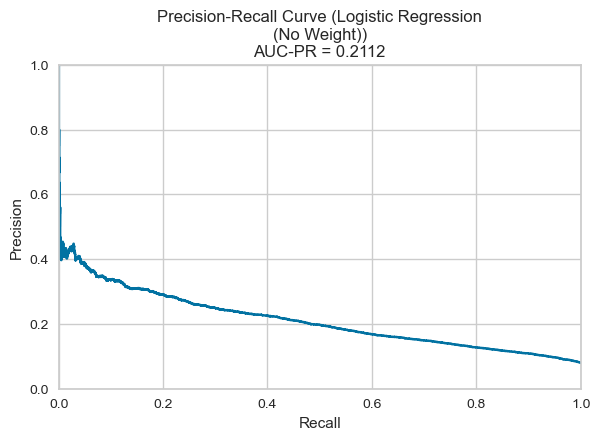

In [70]:
plot_precision_recall_curve("Logistic Regression\n(No Weight)", y_test, test_probs_with_weight)

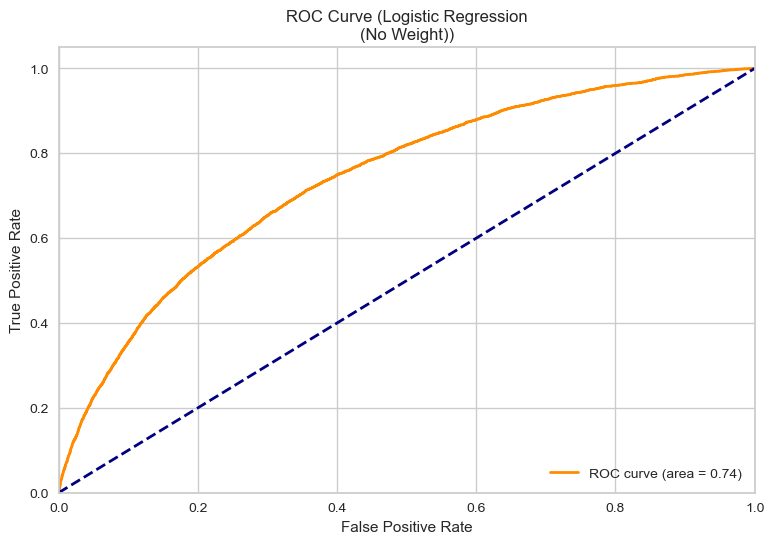

In [71]:
plot_roc_curve("Logistic Regression\n(No Weight)", y_test, test_probs_with_weight)

In [72]:
from imblearn.over_sampling import SMOTE
from imblearn.under_sampling import RandomUnderSampler
from imblearn.combine import SMOTEENN

oversampler = SMOTE(random_state=42)
X_train_resampled, y_train_resampled = oversampler.fit_resample(train, y_train)

# Undersampling using RandomUnderSampler
undersampler = RandomUnderSampler(sampling_strategy='majority', random_state=42)
X_train_resampled, y_train_resampled = undersampler.fit_resample(X_train_resampled, y_train_resampled)

In [73]:
# Create a Logistic Regression model
log_reg_resampled = LogisticRegression(penalty='l1', C=0.1, solver='saga', max_iter=1000)
log_reg_resampled.fit(X_train_resampled, y_train_resampled)

# Evaluate the Logistic Regression model with resampled data
test_preds_resampled, test_probs_resampled = evaluate_classifier(log_reg_resampled, X_train_resampled, y_train_resampled, test, y_test, "Logistic Regression (Resampled)")

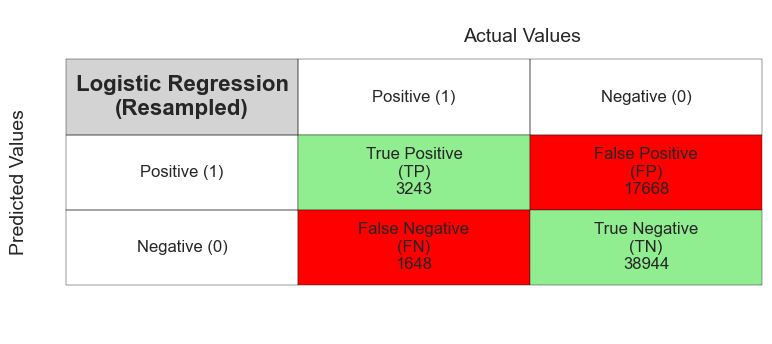

In [74]:
conf_matrix = confusion_matrix(y_test, test_preds_resampled)
visualize_confusion_matrix(conf_matrix, model_name="Logistic Regression\n(Resampled)")

In [75]:
report = classification_report(y_test, test_preds_resampled)
print(report)

              precision    recall  f1-score   support

           0       0.96      0.69      0.80     56612
           1       0.16      0.66      0.25      4891

    accuracy                           0.69     61503
   macro avg       0.56      0.68      0.53     61503
weighted avg       0.90      0.69      0.76     61503



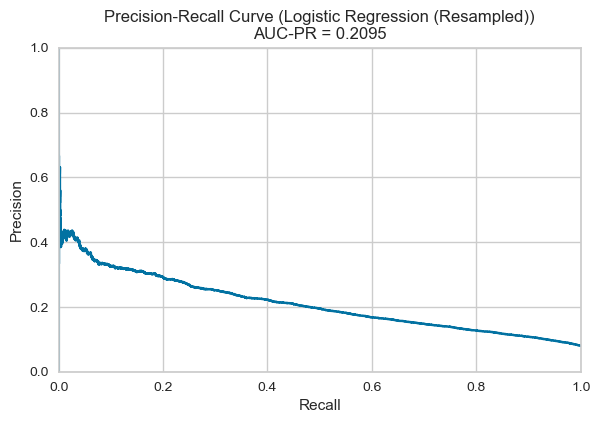

In [76]:
plot_precision_recall_curve("Logistic Regression (Resampled)", y_test, test_probs_resampled)

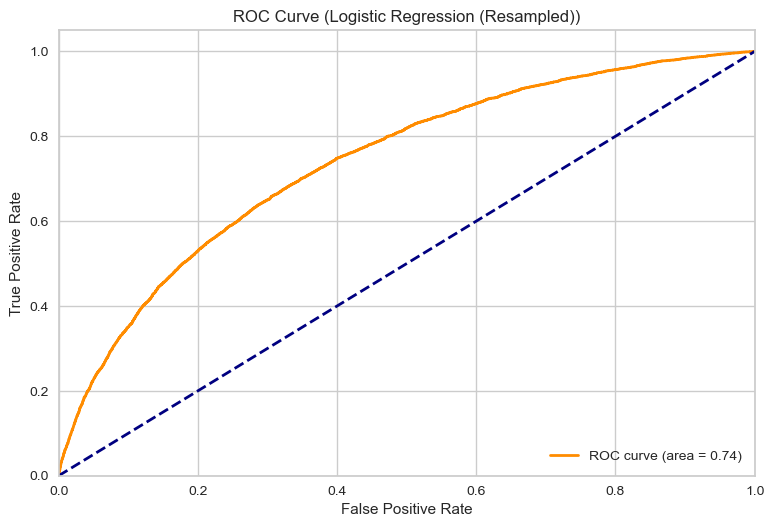

In [77]:
plot_roc_curve("Logistic Regression (Resampled)", y_test, test_probs_resampled)

# RandomForestClassifier

In [78]:
from sklearn.ensemble import RandomForestClassifier

# Create a RandomForestClassifier with specified hyperparameters
param_grid = {
    'n_estimators': 100,      # Number of trees in the forest
    'max_depth': 10,         # Maximum depth of each tree
    'min_samples_split': 2,  # Minimum number of samples required to split an internal node
    'min_samples_leaf': 1    # Minimum number of samples required to be at a leaf node
}



# Create the RandomForestClassifier
rf_classifier = RandomForestClassifier(**param_grid, random_state=42)

# Evaluate the RandomForestClassifier without class_weight
print("Random Forest Classifier (No Class Weight)")
test_preds_no_weight, test_probs_no_weight = evaluate_classifier(rf_classifier,train, y_train, test, y_test, "Random Forest Classifier (No Class Weight)")

# Evaluate the RandomForestClassifier with class_weight
rf_classifier_weighted = RandomForestClassifier(**param_grid, class_weight='balanced', random_state=42)
print("Random Forest Classifier (With Class Weight)")
test_preds_weighted ,test_probs_weighted = evaluate_classifier(rf_classifier_weighted,train, y_train, test, y_test, "Random Forest Classifier (With Class Weight)")

Random Forest Classifier (No Class Weight)


/Users/ismailcanoguz/opt/anaconda3/envs/can/lib/python3.9/site-packages/sklearn/metrics/_classification.py:1471: UndefinedMetricWarning:

Precision is ill-defined and being set to 0.0 due to no predicted samples. Use `zero_division` parameter to control this behavior.



Random Forest Classifier (With Class Weight)


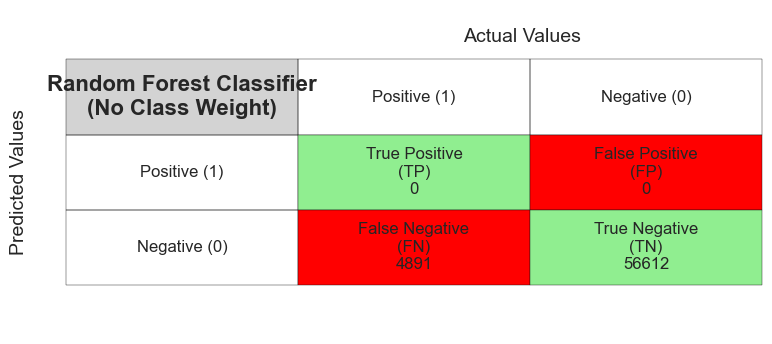

In [79]:
conf_matrix = confusion_matrix(y_test, test_preds_no_weight)
visualize_confusion_matrix(conf_matrix, model_name="Random Forest Classifier\n(No Class Weight)")

In [80]:
report = classification_report(y_test, test_preds_no_weight,zero_division=np.nan)
print(report)

              precision    recall  f1-score   support

           0       0.92      1.00      0.96     56612
           1        nan      0.00       nan      4891

    accuracy                           0.92     61503
   macro avg       0.92      0.50      0.96     61503
weighted avg       0.92      0.92      0.96     61503



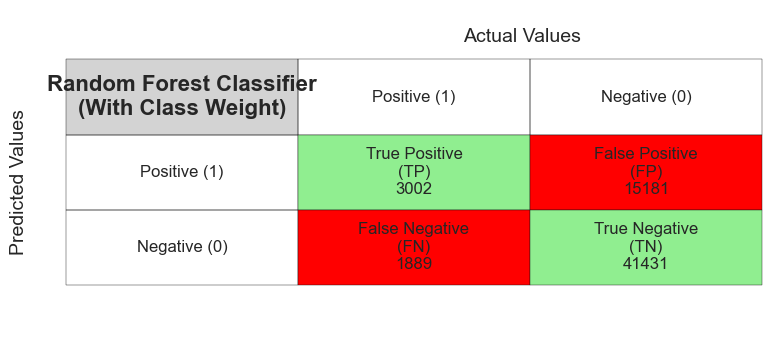

In [130]:
conf_matrix = confusion_matrix(y_test, test_preds_weighted)
visualize_confusion_matrix(conf_matrix, model_name="Random Forest Classifier\n(With Class Weight)")

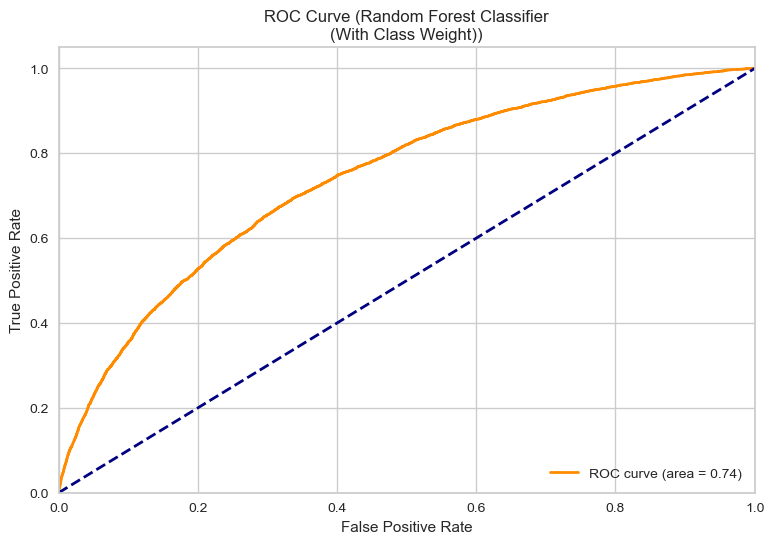

In [82]:
plot_roc_curve("Random Forest Classifier\n(With Class Weight)", y_test,test_probs_weighted)

In [83]:
report = classification_report(y_test,  test_preds_weighted)
print(report)

              precision    recall  f1-score   support

           0       0.96      0.73      0.83     56612
           1       0.17      0.61      0.26      4891

    accuracy                           0.72     61503
   macro avg       0.56      0.67      0.54     61503
weighted avg       0.89      0.72      0.78     61503



In [84]:
rf_classifier_resampled = RandomForestClassifier(**param_grid, random_state=42)
test_preds_rf_resampled, test_probs_rf_resampled = evaluate_classifier(rf_classifier_resampled, X_train_resampled, y_train_resampled, test, y_test, "Random Forest (Resampled)")


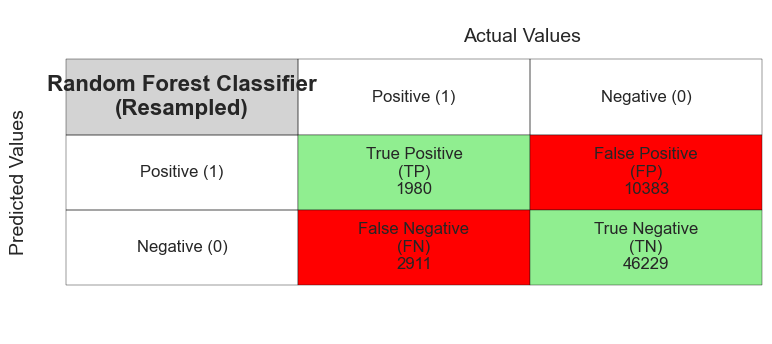

In [85]:
conf_matrix = confusion_matrix(y_test, test_preds_rf_resampled)
visualize_confusion_matrix(conf_matrix, model_name="Random Forest Classifier\n(Resampled)")

In [86]:
report = classification_report(y_test,  test_preds_rf_resampled)
print(report)

              precision    recall  f1-score   support

           0       0.94      0.82      0.87     56612
           1       0.16      0.40      0.23      4891

    accuracy                           0.78     61503
   macro avg       0.55      0.61      0.55     61503
weighted avg       0.88      0.78      0.82     61503



# XGBClassifier

In [87]:
from xgboost import XGBClassifier

# Calculate the class imbalance ratio
imbalance_ratio = np.bincount(y_train)[0] / np.bincount(y_train)[1]

# Create the XGBoost classifier with additional parameters
xgb_params = {
    'scale_pos_weight': imbalance_ratio,  # Class weight adjustment
    'random_state': 42,                  # Random seed for reproducibility
    'n_estimators': 100,                 # Number of boosting rounds (trees)
    'max_depth': 5,                     # Maximum depth of each tree
    'learning_rate': 0.1,               # Learning rate (shrinkage)
    'subsample': 0.8,                   # Fraction of training data to use for each boosting round
    'colsample_bytree': 0.8,            # Fraction of features to use for each tree
    'min_child_weight': 1,              # Minimum sum of instance weight (Hessian) needed in a child
}

xgb_classifier = XGBClassifier(**xgb_params)

# Evaluate the XGBoost classifier
print("XGBoost Classifier (With scale_pos_weight)")
test_preds_xgb, test_probs_xgb = evaluate_classifier(xgb_classifier, train, y_train, test, y_test, "XGBoost Classifier (With scale_pos_weight)")


XGBoost Classifier (With scale_pos_weight)


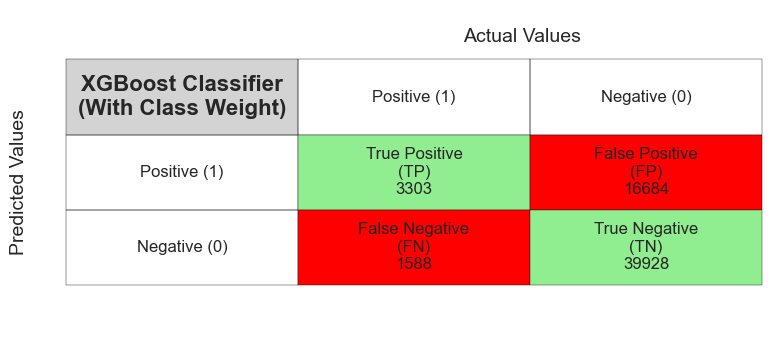

In [88]:
conf_matrix = confusion_matrix(y_test, test_preds_xgb)
visualize_confusion_matrix(conf_matrix, model_name="XGBoost Classifier\n(With Class Weight)")


In [89]:
report = classification_report(y_test,  test_preds_xgb)
print(report)

              precision    recall  f1-score   support

           0       0.96      0.71      0.81     56612
           1       0.17      0.68      0.27      4891

    accuracy                           0.70     61503
   macro avg       0.56      0.69      0.54     61503
weighted avg       0.90      0.70      0.77     61503



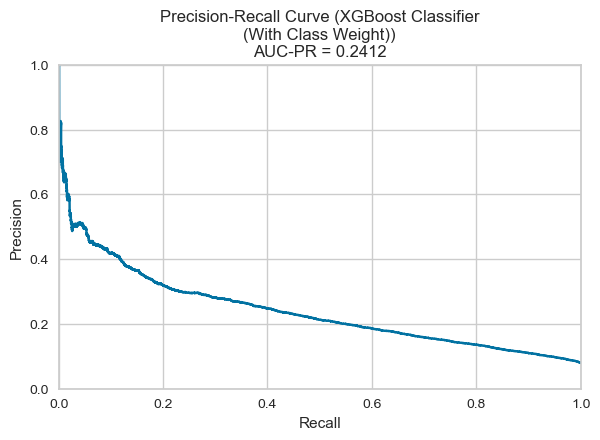

In [90]:
plot_precision_recall_curve("XGBoost Classifier\n(With Class Weight)", y_test,test_probs_xgb)

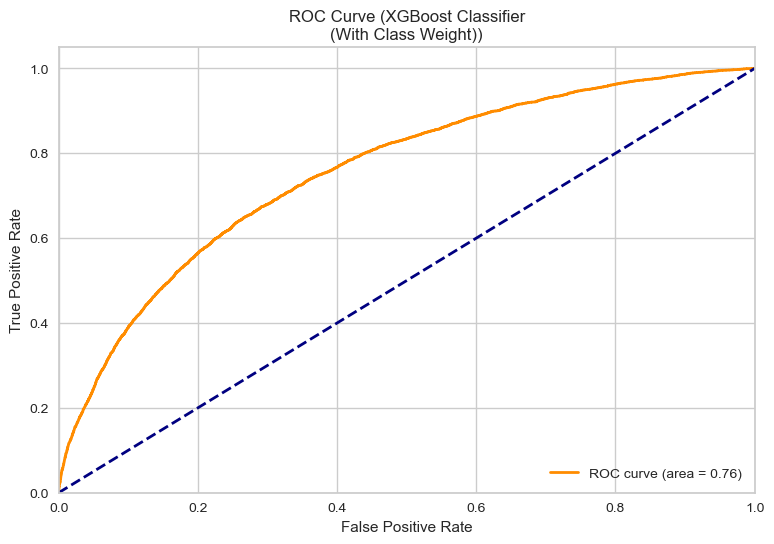

In [91]:
plot_roc_curve("XGBoost Classifier\n(With Class Weight)", y_test,test_probs_xgb)

# LGBMClassifier

In [92]:
# from lightgbm import LGBMClassifier
# from sklearn.model_selection import GridSearchCV

# # Define the parameter grid for grid search
# param_grid = {
#     'scale_pos_weight': [imbalance_ratio],  # Class weight adjustment
#     'n_estimators': [50, 100, 200],        # Number of boosting rounds (trees)
#     'max_depth': [5, 10, 20],             # Maximum depth of trees
#     'learning_rate': [0.1, 0.01],         # Learning rate
#     'subsample': [0.8, 0.9],             # Fraction of training data to use for each boosting round
#     'colsample_bytree': [0.8, 0.9],      # Fraction of features to use for each tree
#     'reg_lambda': [1.0, 0.1],            # L2 regularization term (lambda)
#     'num_leaves': [32, 64],               # Number of leaves in each tree
# }

# # Create a LightGBM classifier
# lgbm_classifier = LGBMClassifier(random_state=42)

# # Create a grid search object
# grid_search = GridSearchCV(estimator=lgbm_classifier, param_grid=param_grid, scoring='roc_auc', cv=5)

# # Fit the grid search to the data
# grid_search.fit(X_train, y_train)

# # Get the best hyperparameters
# best_params = grid_search.best_params_

# # Create a LightGBM classifier with the best hyperparameters
# best_lgbm_classifier = LGBMClassifier(**best_params)

# print(best_lgbm_classifier)
# # Evaluate the best LightGBM classifier
# test_preds_lgbm, test_probs_lgbm = evaluate_classifier(best_lgbm_classifier, X_train, y_train, X_test, y_test, "Best LightGBM Classifier")


In [93]:
from lightgbm import LGBMClassifier


# Calculate the class imbalance ratio
imbalance_ratio = np.bincount(y_train)[0] / np.bincount(y_train)[1]

lgbm_params = {
    'scale_pos_weight': imbalance_ratio,  # Class weight adjustment
    'random_state': 42,                  # Random seed for reproducibility
    'n_estimators': 100,                 # Number of boosting rounds (trees)
    'max_depth': 20,                     # Maximum depth of trees
    'learning_rate': 0.1,               # Learning rate
    'subsample': 0.8,                   # Fraction of training data to use for each boosting round
    'colsample_bytree': 0.9,            # Fraction of features to use for each tree
    'reg_lambda': 1.0,                  # L2 regularization term (lambda)
    'num_leaves': 32,                   # Number of leaves in each tree
}

lgbm_classifier = LGBMClassifier(**lgbm_params)

# Evaluate the LightGBM classifier
print("LightGBM Classifier (With Class Weight)")
test_preds_lgbm, test_probs_lgbm = evaluate_classifier(lgbm_classifier, train, y_train, test, y_test, "LightGBM Classifier (With Class Weight)")

LightGBM Classifier (With Class Weight)
[LightGBM] [Info] Number of positive: 19934, number of negative: 226074
[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.015374 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 4632
[LightGBM] [Info] Number of data points in the train set: 246008, number of used features: 50
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.081030 -> initscore=-2.428436
[LightGBM] [Info] Start training from score -2.428436


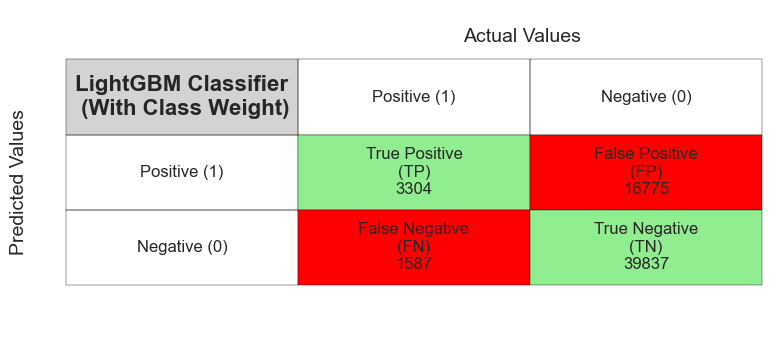

In [94]:
conf_matrix = confusion_matrix(y_test, test_preds_lgbm)
visualize_confusion_matrix(conf_matrix, model_name="LightGBM Classifier\n (With Class Weight)")

In [95]:
report = classification_report(y_test,  test_preds_lgbm)
print(report)

              precision    recall  f1-score   support

           0       0.96      0.70      0.81     56612
           1       0.16      0.68      0.26      4891

    accuracy                           0.70     61503
   macro avg       0.56      0.69      0.54     61503
weighted avg       0.90      0.70      0.77     61503



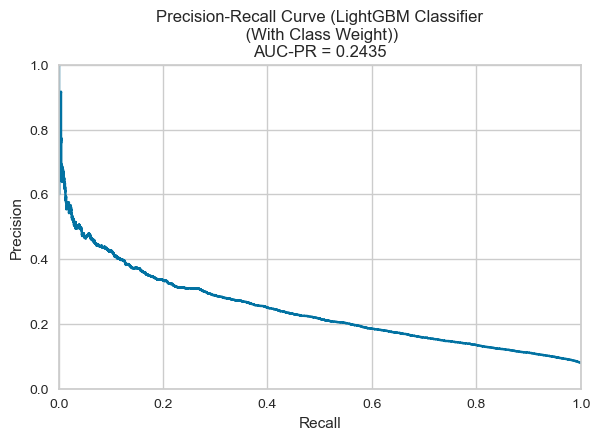

In [96]:
plot_precision_recall_curve("LightGBM Classifier\n (With Class Weight)", y_test, test_probs_lgbm)

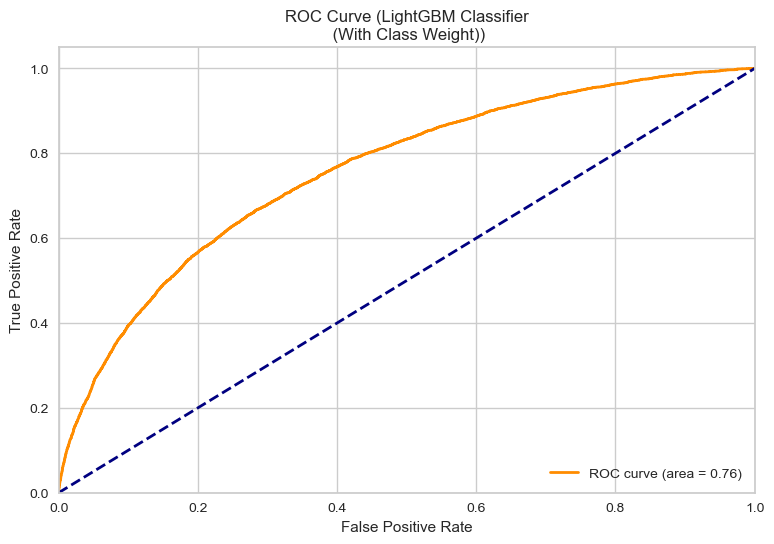

In [97]:
plot_roc_curve("LightGBM Classifier\n (With Class Weight)", y_test, test_probs_lgbm)

# Entraînement Final 

In [98]:
from sklearn.preprocessing import MinMaxScaler
from sklearn.impute import SimpleImputer


# Drop the target from the training data
if 'TARGET' in df_application_train:
    train = df_application_train.drop(columns = ['TARGET'])
else:
    train = df_application_train.copy()
    
# Feature names
features = list(train.columns)

# Copy of the testing data
test = df_application_test.copy()

# Median imputation of missing values
imputer = SimpleImputer(strategy = 'median')

# Scale each feature to 0-1
scaler = MinMaxScaler(feature_range = (0, 1))

# Fit on the training data
imputer.fit(train)

# Transform both training and testing data
train = imputer.transform(train)
test = imputer.transform(df_application_test)

# Repeat with the scaler
scaler.fit(train)
train = scaler.transform(train)
test = scaler.transform(test)

print('Training data shape: ', train.shape)
print('Testing data shape: ', test.shape)

Training data shape:  (307511, 240)
Testing data shape:  (48744, 240)


In [99]:
train_target = df_application_train['TARGET']

In [143]:
X_train

,EXT_SOURCE_3,EXT_SOURCE_2,EXT_SOURCE_1,DAYS_BIRTH,DAYS_EMPLOYED,REGION_RATING_CLIENT_W_CITY,REGION_RATING_CLIENT,NAME_INCOME_TYPE_Working,NAME_EDUCATION_TYPE_Higher education,DAYS_LAST_PHONE_CHANGE,CODE_GENDER_M,CODE_GENDER_F,DAYS_ID_PUBLISH,REG_CITY_NOT_WORK_CITY,NAME_EDUCATION_TYPE_Secondary / secondary special,NAME_INCOME_TYPE_Pensioner,DAYS_EMPLOYED_ANOM,ORGANIZATION_TYPE_XNA,FLAG_EMP_PHONE,REG_CITY_NOT_LIVE_CITY,FLAG_DOCUMENT_3,FLOORSMAX_AVG,FLOORSMAX_MEDI,FLOORSMAX_MODE,OCCUPATION_TYPE_Laborers,EMERGENCYSTATE_MODE_No,DAYS_REGISTRATION,HOUSETYPE_MODE_block of flats,AMT_GOODS_PRICE,OWN_CAR_AGE,REGION_POPULATION_RELATIVE,ELEVATORS_AVG,ELEVATORS_MEDI,FLOORSMIN_AVG,FLOORSMIN_MEDI,WALLSMATERIAL_MODE_Panel,LIVINGAREA_AVG,LIVINGAREA_MEDI,FLOORSMIN_MODE,TOTALAREA_MODE,LIVE_CITY_NOT_WORK_CITY,DEF_30_CNT_SOCIAL_CIRCLE,ELEVATORS_MODE,DEF_60_CNT_SOCIAL_CIRCLE,NAME_CONTRACT_TYPE,LIVINGAREA_MODE,AMT_CREDIT,OCCUPATION_TYPE_Drivers,NAME_HOUSING_TYPE_With parents,APARTMENTS_AVG
271986,0.345785,0.528154,0.694180,23480,NaN,2,2,False,False,-732.0,False,True,-4783,0,True,True,True,True,0,0,1,0.1667,0.1667,0.1667,False,True,-5533.0,True,135000.0,NaN,0.010643,0.00,0.00,0.2083,0.2083,False,0.0843,0.0858,0.2083,0.1026,0,0.0,0.0000,0.0,0,0.0878,177768.0,False,False,0.0928
70475,0.749022,0.554524,0.563586,23657,-2787.0,3,3,True,False,-1732.0,False,True,-4506,0,True,False,False,False,1,0,1,0.1667,0.1667,0.1667,True,True,-13407.0,True,225000.0,NaN,0.020246,0.00,0.00,0.2083,0.2083,True,0.0367,0.0545,0.2083,0.0019,0,0.0,0.0000,0.0,0,0.0025,296280.0,False,False,0.0619
234278,0.267869,0.349323,NaN,24195,NaN,2,2,False,False,-2.0,False,True,-4124,0,True,True,True,True,0,0,0,NaN,NaN,NaN,False,False,-1840.0,False,252000.0,NaN,0.030755,NaN,NaN,NaN,NaN,False,NaN,NaN,NaN,NaN,0,0.0,NaN,0.0,0,NaN,291915.0,False,False,NaN
29814,0.780144,0.333906,NaN,22354,NaN,2,2,False,False,-930.0,False,True,-4364,0,True,True,True,True,0,0,0,0.1667,0.1667,0.1667,False,True,-885.0,True,477000.0,NaN,0.025164,0.00,0.00,NaN,NaN,False,0.0678,0.0690,NaN,0.0693,0,0.0,0.0000,0.0,0,0.0707,477000.0,False,False,0.0722
165307,0.313917,0.554540,NaN,10877,-3460.0,3,3,True,False,0.0,True,False,-3552,1,True,False,False,False,1,1,1,NaN,NaN,NaN,True,False,-3513.0,False,450000.0,15.0,0.010500,NaN,NaN,NaN,NaN,False,NaN,NaN,NaN,NaN,1,0.0,NaN,0.0,0,NaN,450000.0,False,False,NaN
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
55293,0.670652,0.471430,0.605633,17343,-2303.0,2,2,False,True,-1608.0,False,True,-868,0,False,False,False,False,1,0,1,0.3750,0.3750,0.3750,False,True,-4858.0,True,630000.0,NaN,0.025164,0.12,0.12,0.0417,0.0417,True,0.0603,0.0613,0.0417,0.0802,0,0.0,0.1208,0.0,0,0.0628,704844.0,False,False,0.0928
136767,NaN,0.157233,0.305485,11066,-1215.0,2,2,True,False,-223.0,False,True,-1859,1,True,False,False,False,1,0,1,NaN,NaN,NaN,False,False,-655.0,False,157500.0,NaN,0.018634,NaN,NaN,NaN,NaN,False,NaN,NaN,NaN,NaN,1,0.0,NaN,0.0,0,NaN,182448.0,False,False,NaN
204614,0.298595,0.614759,0.641837,18560,-5079.0,1,1,False,True,-1284.0,True,False,-2075,1,False,False,False,False,1,0,0,0.1667,0.1667,0.1667,False,True,-4457.0,True,675000.0,12.0,0.046220,NaN,NaN,NaN,NaN,False,NaN,NaN,NaN,0.0648,1,0.0,NaN,0.0,0,NaN,675000.0,False,False,0.0649
214539,NaN,0.565430,NaN,10454,-816.0,2,2,True,True,-290.0,True,False,-2759,1,False,False,False,False,1,0,0,0.0417,0.0417,0.0417,False,True,-9548.0,True,675000.0,0.0,0.018850,NaN,NaN,NaN,NaN,False,NaN,NaN,NaN,0.0111,1,1.0,NaN,1.0,0,NaN,675000.0,False,False,0.0124


In [144]:
from imblearn.ensemble import BalancedRandomForestClassifier
from sklearn.model_selection import GridSearchCV
from sklearn.metrics import make_scorer, roc_auc_score

# Assuming you have already loaded your training data into 'X_train' and 'y_train'

# Create the BalancedRandomForestClassifier with default parameters
brf_base = BalancedRandomForestClassifier(n_estimators=100, random_state=42)

# Calculate the class imbalance ratio
imbalance_ratio = np.bincount(y_train)[0] / np.bincount(y_train)[1]

# Define the reduced parameter grid to search
param_grid = {
    'n_estimators': [50, 100],
    'max_depth': [10, 20],
    'min_samples_split': [2, 5],
    'min_samples_leaf': [1, 2],
    'max_features': ['auto', 'sqrt'],
}

# Create the GridSearchCV object with AUC as the scoring metric
grid_search = GridSearchCV(
    estimator=brf_base,
    param_grid=param_grid,
    scoring=make_scorer(roc_auc_score, greater_is_better=True),
    cv=3,  # Use 3-fold cross-validation
    verbose=1
)

# Fit the grid search to the data
grid_search.fit(train, train_target)


# Get the best parameters and best model
best_params = grid_search.best_params_
best_model = grid_search.best_estimator_

# Print the best parameters
print("Best Parameters:", best_params)

Fitting 3 folds for each of 32 candidates, totalling 96 fits


The default of `sampling_strategy` will change from `'auto'` to `'all'` in version 0.13. This change will follow the implementation proposed in the original paper. Set to `'all'` to silence this warning and adopt the future behaviour.
The default of `replacement` will change from `False` to `True` in version 0.13. This change will follow the implementation proposed in the original paper. Set to `True` to silence this warning and adopt the future behaviour.
The default of `sampling_strategy` will change from `'auto'` to `'all'` in version 0.13. This change will follow the implementation proposed in the original paper. Set to `'all'` to silence this warning and adopt the future behaviour.
The default of `replacement` will change from `False` to `True` in version 0.13. This change will follow the implementation proposed in the original paper. Set to `True` to silence this warning and adopt the future behaviour.
The default of `sampling_strategy` will change from `'auto'` to `'all'` in ver

Best Parameters: {'max_depth': 10, 'max_features': 'sqrt', 'min_samples_leaf': 1, 'min_samples_split': 2, 'n_estimators': 100}


The default of `sampling_strategy` will change from `'auto'` to `'all'` in version 0.13. This change will follow the implementation proposed in the original paper. Set to `'all'` to silence this warning and adopt the future behaviour.
The default of `replacement` will change from `False` to `True` in version 0.13. This change will follow the implementation proposed in the original paper. Set to `True` to silence this warning and adopt the future behaviour.


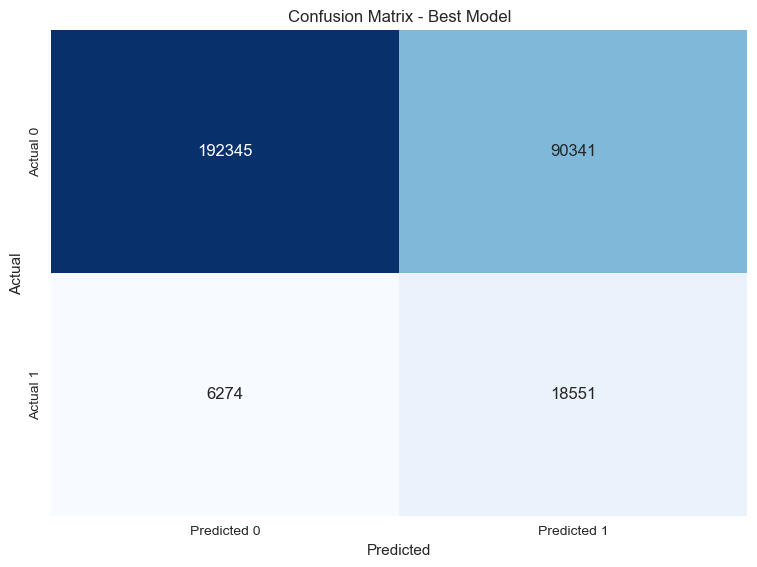

In [145]:
from sklearn.metrics import confusion_matrix, roc_curve, roc_auc_score
import matplotlib.pyplot as plt
import seaborn as sns

# Assuming 'best_model' is the result of the GridSearchCV

# Fit the best model on the training data
best_model.fit(train, train_target)

# Predictions and probabilities for both train and test using the best model
train_preds_best = best_model.predict(train)
train_probs_best = best_model.predict_proba(train)[:, 1]

# Confusion matrix for the training data
conf_matrix_best = confusion_matrix(train_target, train_preds_best)

# Visualize the confusion matrix
plt.figure(figsize=(8, 6))
sns.heatmap(conf_matrix_best, annot=True, fmt='d', cmap='Blues', cbar=False,
            xticklabels=['Predicted 0', 'Predicted 1'],
            yticklabels=['Actual 0', 'Actual 1'])
plt.title('Confusion Matrix - Best Model')
plt.xlabel('Predicted')
plt.ylabel('Actual')
plt.show()

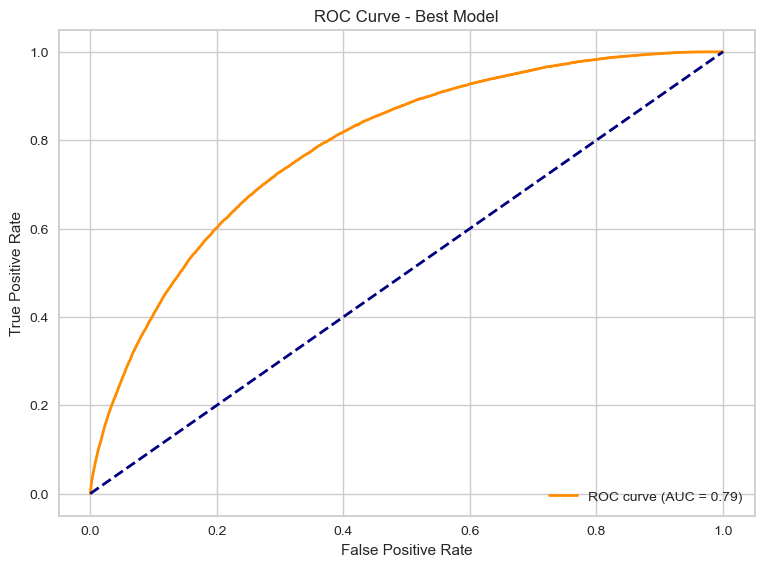

In [146]:
# ROC curve for the training data
fpr, tpr, thresholds = roc_curve(train_target, train_probs_best)
roc_auc = roc_auc_score(train_target, train_probs_best)

# Plot the ROC curve
plt.figure(figsize=(8, 6))
plt.plot(fpr, tpr, color='darkorange', lw=2, label=f'ROC curve (AUC = {roc_auc:.2f})')
plt.plot([0, 1], [0, 1], color='navy', lw=2, linestyle='--')
plt.xlabel('False Positive Rate')
plt.ylabel('True Positive Rate')
plt.title('ROC Curve - Best Model')
plt.legend(loc='lower right')
plt.show()


In [147]:
import pickle
import numpy as np
from imblearn.ensemble import RUSBoostClassifier
from sklearn.model_selection import GridSearchCV
from sklearn.metrics import make_scorer, roc_auc_score

# Assuming you have already loaded your training data into 'X_train' and 'y_train'

# Create the RUSBoost Classifier with default parameters
rusboost_base = RUSBoostClassifier(n_estimators=100, random_state=42)

# Define the parameter grid to search
param_grid = {
    'n_estimators': [50, 100, 150],
    'learning_rate': [0.05, 0.1, 0.2],
}

# Create the GridSearchCV object with AUC as the scoring metric
grid_search_rusboost = GridSearchCV(
    estimator=rusboost_base,
    param_grid=param_grid,
    scoring=make_scorer(roc_auc_score, greater_is_better=True),
    cv=5,  # Use 5-fold cross-validation
    verbose=1
)

# Fit the grid search to the data
grid_search_rusboost.fit(train, train_target)

# Get the best parameters and best model
best_params_rusboost = grid_search_rusboost.best_params_
best_model_rusboost = grid_search_rusboost.best_estimator_

# Print the best parameters
print("Best Parameters - RUSBoost Classifier:", best_params_rusboost)

Fitting 5 folds for each of 9 candidates, totalling 45 fits
Best Parameters - RUSBoost Classifier: {'learning_rate': 0.2, 'n_estimators': 50}


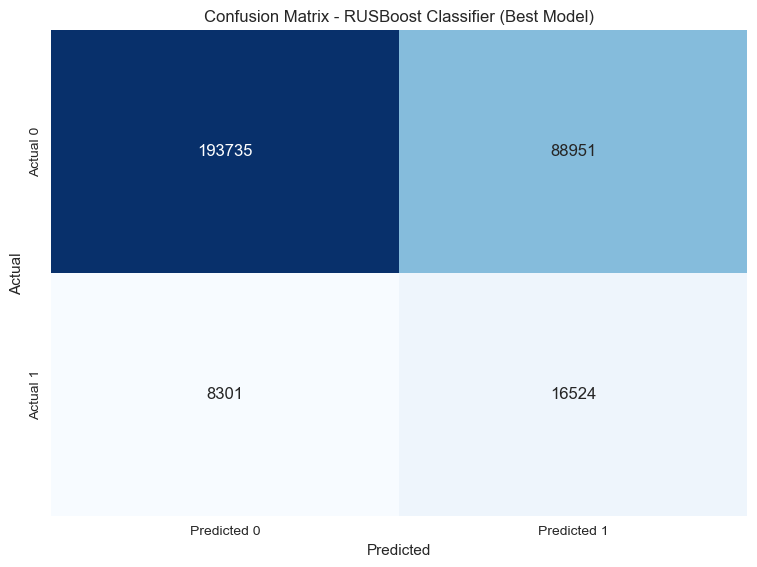

In [148]:
# Fit the best RUSBoost Classifier on the training data
best_model_rusboost.fit(train, train_target)

# Predictions and probabilities for both train and test using the best RUSBoost Classifier
train_preds_rusboost = best_model_rusboost.predict(train)
train_probs_rusboost = best_model_rusboost.predict_proba(train)[:, 1]

# Confusion matrix for the training data
conf_matrix_rusboost = confusion_matrix(train_target, train_preds_rusboost)

# Visualize the confusion matrix
plt.figure(figsize=(8, 6))
sns.heatmap(conf_matrix_rusboost, annot=True, fmt='d', cmap='Blues', cbar=False,
            xticklabels=['Predicted 0', 'Predicted 1'],
            yticklabels=['Actual 0', 'Actual 1'])
plt.title('Confusion Matrix - RUSBoost Classifier (Best Model)')
plt.xlabel('Predicted')
plt.ylabel('Actual')
plt.show()

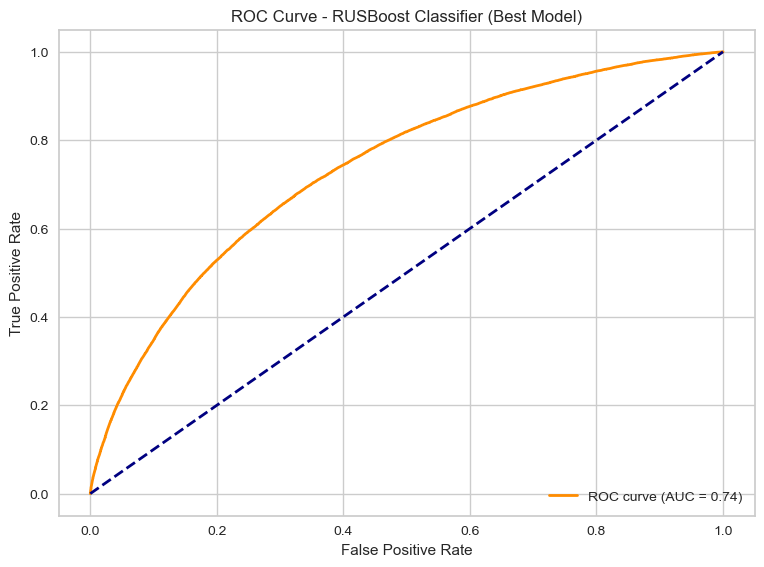

In [149]:
# ROC curve for the training data
train_probs_rusboost = best_model_rusboost.predict_proba(train)[:, 1]
fpr_rusboost, tpr_rusboost, thresholds_rusboost = roc_curve(train_target, train_probs_rusboost)
roc_auc_rusboost = roc_auc_score(train_target, train_probs_rusboost)

# Plot the ROC curve
plt.figure(figsize=(8, 6))
plt.plot(fpr_rusboost, tpr_rusboost, color='darkorange', lw=2, label=f'ROC curve (AUC = {roc_auc_rusboost:.2f})')
plt.plot([0, 1], [0, 1], color='navy', lw=2, linestyle='--')
plt.xlabel('False Positive Rate')
plt.ylabel('True Positive Rate')
plt.title('ROC Curve - RUSBoost Classifier (Best Model)')
plt.legend(loc='lower right')
plt.show()

In [141]:
import pickle
import numpy as np
from lightgbm import LGBMClassifier
from sklearn.model_selection import GridSearchCV
from sklearn.metrics import make_scorer, roc_auc_score

# Assuming you have already loaded your training data into 'train' and 'train_target'

# Calculate the class imbalance ratio
imbalance_ratio = np.bincount(train_target)[0] / np.bincount(train_target)[1]

# Create the LGBMClassifier with default parameters
lgbm_base = LGBMClassifier(scale_pos_weight=imbalance_ratio, random_state=42)

# Define the reduced parameter grid to search
param_grid = {
    'n_estimators': [100, 150, 200],
    'max_depth': [20, 30],
    'learning_rate': [0.1, 0.15],
    'subsample': [0.8],
    'colsample_bytree': [0.9],
    'reg_lambda': [1.0],
    'num_leaves': [32]
}

# Create the GridSearchCV object with AUC as the scoring metric
grid_search = GridSearchCV(
    estimator=lgbm_base,
    param_grid=param_grid,
    scoring=make_scorer(roc_auc_score, greater_is_better=True),
    cv=3,  # Use 3-fold cross-validation
    verbose=1
)

# Fit the grid search to the data
grid_search.fit(train, train_target)

# Get the best parameters and best model
best_params = grid_search.best_params_
best_model = grid_search.best_estimator_

# Print the best parameters
print("Best Parameters:", best_params)

Fitting 3 folds for each of 12 candidates, totalling 36 fits
[LightGBM] [Info] Number of positive: 16550, number of negative: 188457
[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.023369 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 11722
[LightGBM] [Info] Number of data points in the train set: 205007, number of used features: 231
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.080729 -> initscore=-2.432484
[LightGBM] [Info] Start training from score -2.432484
[LightGBM] [Info] Number of positive: 16550, number of negative: 188457
[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.021490 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 11613
[LightGBM] [Info] Number of data points in t

In [138]:
import pickle
from lightgbm import LGBMClassifier

# Calculate the class imbalance ratio
imbalance_ratio = np.bincount(train_target)[0] / np.bincount(train_target)[1]

# Create the LGBMClassifier with additional parameters
lgbm_params = {
    'scale_pos_weight': imbalance_ratio,  # Class weight adjustment
    'random_state': 42,                  # Random seed for reproducibility
    'n_estimators': 100,                 # Number of boosting rounds (trees)
    'max_depth': 20,                     # Maximum depth of trees
    'learning_rate': 0.1,               # Learning rate
    'subsample': 0.8,                   # Fraction of training data to use for each boosting round
    'colsample_bytree': 0.9,            # Fraction of features to use for each tree
    'reg_lambda': 1.0,                  # L2 regularization term (lambda)
    'num_leaves': 32                 # Number of leaves in each tree
}

lgbm_classifier = LGBMClassifier(**lgbm_params)

lgbm_classifier.fit(train, train_target)

# Save the LGBMClassifier model to a file using pickle
with open('lgbm_model.pkl', 'wb') as model_file:
    pickle.dump(lgbm_classifier, model_file)


[LightGBM] [Info] Number of positive: 24825, number of negative: 282686
[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.034737 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 11720
[LightGBM] [Info] Number of data points in the train set: 307511, number of used features: 234
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.080729 -> initscore=-2.432486
[LightGBM] [Info] Start training from score -2.432486


In [100]:
import pickle
from lightgbm import LGBMClassifier

# Calculate the class imbalance ratio
imbalance_ratio = np.bincount(train_target)[0] / np.bincount(train_target)[1]

# Create the LGBMClassifier with additional parameters
lgbm_params = {
    'scale_pos_weight': imbalance_ratio,  # Class weight adjustment
    'random_state': 42,                  # Random seed for reproducibility
    'n_estimators': 100,                 # Number of boosting rounds (trees)
    'max_depth': 20,                     # Maximum depth of trees
    'learning_rate': 0.1,               # Learning rate
    'subsample': 0.8,                   # Fraction of training data to use for each boosting round
    'colsample_bytree': 0.9,            # Fraction of features to use for each tree
    'reg_lambda': 1.0,                  # L2 regularization term (lambda)
    'num_leaves': 32,                   # Number of leaves in each tree
}

lgbm_classifier = LGBMClassifier(**lgbm_params)

lgbm_classifier.fit(train, train_target)

# Save the LGBMClassifier model to a file using pickle
with open('lgbm_model.pkl', 'wb') as model_file:
    pickle.dump(lgbm_classifier, model_file)


[LightGBM] [Info] Number of positive: 24825, number of negative: 282686
[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.033611 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 11720
[LightGBM] [Info] Number of data points in the train set: 307511, number of used features: 234
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.080729 -> initscore=-2.432486
[LightGBM] [Info] Start training from score -2.432486


In [139]:
lgbm_classifier.fit(train, train_target)

# Predictions and probabilities for both train and test
train_preds_lgb = lgbm_classifier.predict(train)
train_probs_lgb = lgbm_classifier.predict_proba(train)[:, 1]
test_preds_lgb = lgbm_classifier.predict(test)
test_probs_lgb = lgbm_classifier.predict_proba(test)[:, 1]

[LightGBM] [Info] Number of positive: 24825, number of negative: 282686
[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.033306 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 11720
[LightGBM] [Info] Number of data points in the train set: 307511, number of used features: 234
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.080729 -> initscore=-2.432486
[LightGBM] [Info] Start training from score -2.432486


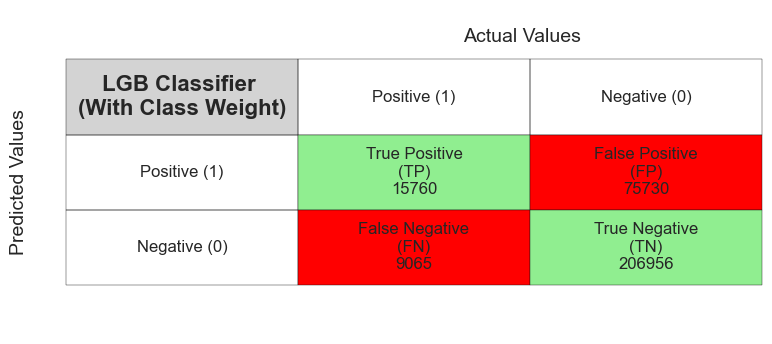

In [140]:
conf_matrix = confusion_matrix(train_target, train_preds_lgb)
visualize_confusion_matrix(conf_matrix, model_name="LGB Classifier \n(With Class Weight)")

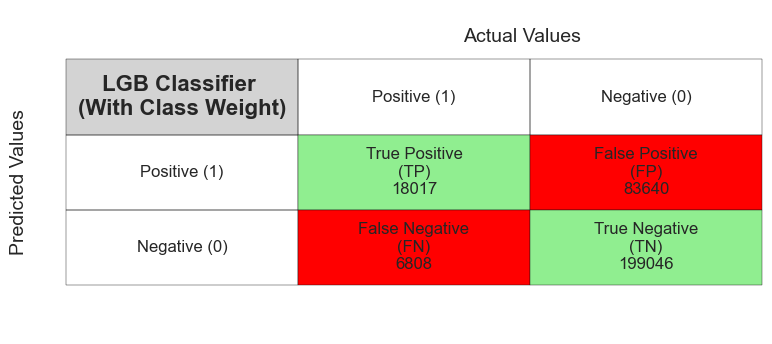

In [102]:
conf_matrix = confusion_matrix(train_target, train_preds_lgb)
visualize_confusion_matrix(conf_matrix, model_name="LGB Classifier \n(With Class Weight)")

In [135]:
report = classification_report(train_target, train_preds_lgb)
print(report)

              precision    recall  f1-score   support

           0       0.96      0.73      0.83    282686
           1       0.17      0.64      0.27     24825

    accuracy                           0.72    307511
   macro avg       0.57      0.68      0.55    307511
weighted avg       0.89      0.72      0.78    307511



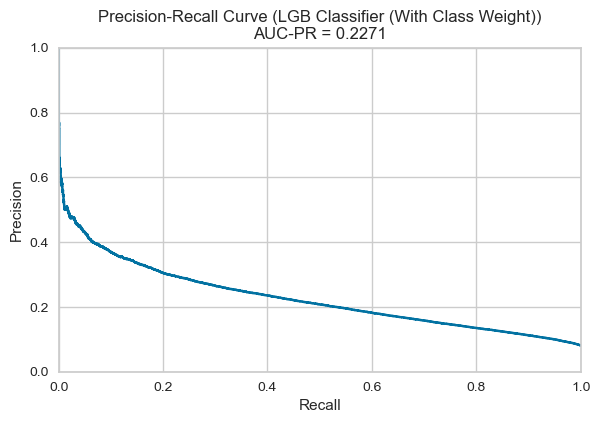

In [136]:
plot_precision_recall_curve("LGB Classifier (With Class Weight)", train_target, train_probs_lgb)

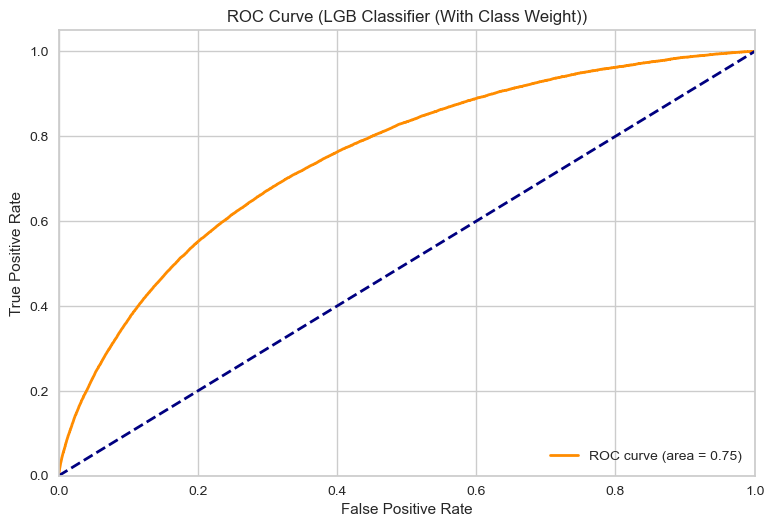

In [137]:
plot_roc_curve("LGB Classifier (With Class Weight)", train_target, train_probs_lgb)

In [106]:
# Convert probability values to credit scores
def convert_probabilities_to_credit_scores(probabilities):
    # Invert the probabilities: higher probability of 0 leads to a higher credit score
    inverted_probabilities = 1 - probabilities
    # Rescale to a 0-100 scale
    credit_scores = inverted_probabilities * 100
    return credit_scores

# Convert train and test probabilities to credit scores
train_credit_scores = convert_probabilities_to_credit_scores(train_probs_lgb)
test_credit_scores = convert_probabilities_to_credit_scores(test_probs_lgb)



In [107]:
df_application_test['Credit_score'] = test_credit_scores

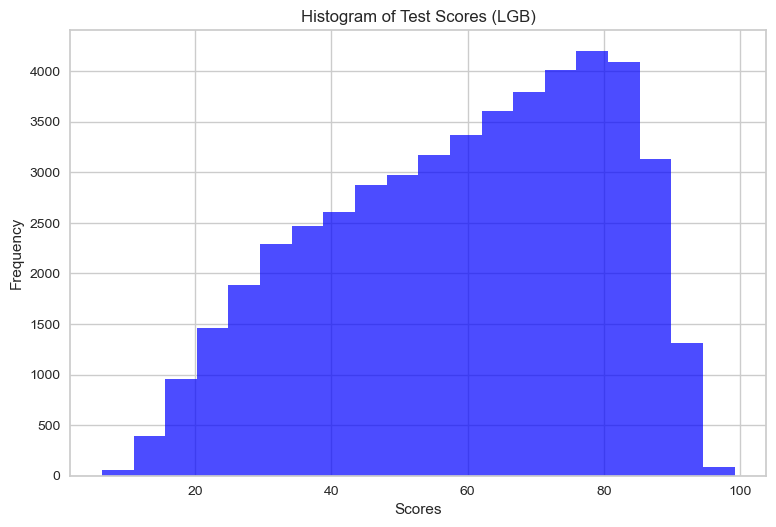

In [108]:
plt.hist(test_credit_scores, bins=20, color='blue', alpha=0.7)
plt.xlabel('Scores')
plt.ylabel('Frequency')
plt.title('Histogram of Test Scores (LGB)')
plt.show()

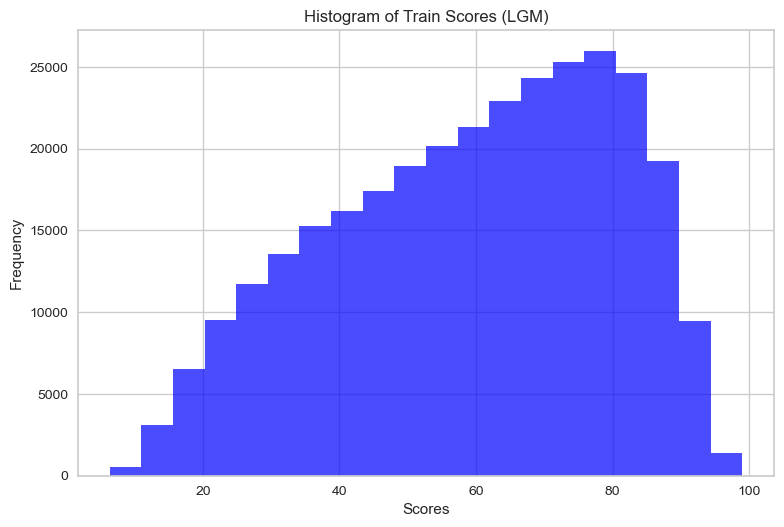

In [109]:
plt.hist(train_credit_scores, bins=20, color='blue', alpha=0.7)
plt.xlabel('Scores')
plt.ylabel('Frequency')
plt.title('Histogram of Train Scores (LGM)')
plt.show()

# Feature Importance

In [110]:
import shap
shap.initjs()


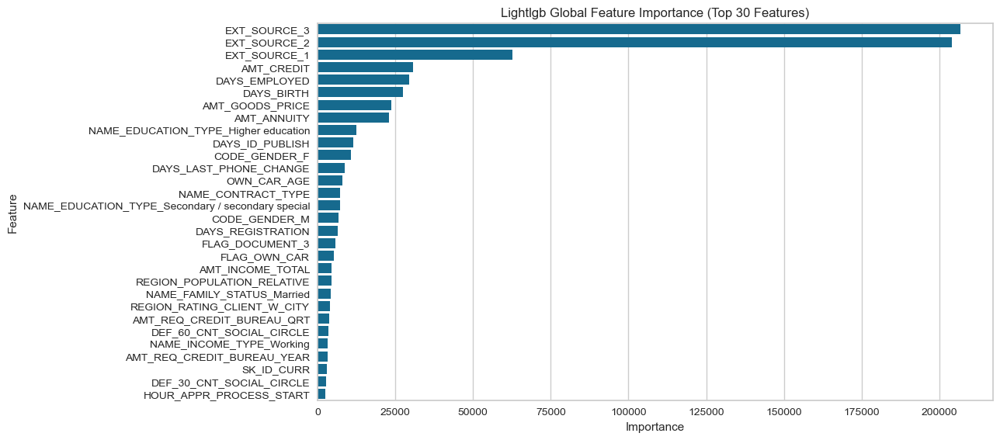

In [111]:
# Get feature importances
feature_importance = lgbm_classifier.booster_.feature_importance(importance_type='gain')

# Create a DataFrame to store the feature importances along with feature names
importance_df = pd.DataFrame({'Feature': features, 'Importance': feature_importance})

# Sort the DataFrame by importance values in descending order
importance_df = importance_df.sort_values(by='Importance', ascending=False)

# Create a bar plot for global feature importance
plt.figure(figsize=(10, 6))
sns.barplot(x='Importance', y='Feature', data=importance_df.head(30))
plt.title('Lightlgb Global Feature Importance (Top 30 Features)')
plt.xlabel('Importance')
plt.ylabel('Feature')
plt.show()

In [112]:
# Create a DataFrame using the numpy array and column names
X_train_encoded = pd.DataFrame(train, columns=features)

In [113]:
X_train_encoded

,SK_ID_CURR,NAME_CONTRACT_TYPE,FLAG_OWN_CAR,FLAG_OWN_REALTY,CNT_CHILDREN,AMT_INCOME_TOTAL,AMT_CREDIT,AMT_ANNUITY,AMT_GOODS_PRICE,REGION_POPULATION_RELATIVE,DAYS_BIRTH,DAYS_EMPLOYED,DAYS_REGISTRATION,DAYS_ID_PUBLISH,OWN_CAR_AGE,FLAG_MOBIL,FLAG_EMP_PHONE,FLAG_WORK_PHONE,FLAG_CONT_MOBILE,FLAG_PHONE,FLAG_EMAIL,CNT_FAM_MEMBERS,REGION_RATING_CLIENT,REGION_RATING_CLIENT_W_CITY,HOUR_APPR_PROCESS_START,REG_REGION_NOT_LIVE_REGION,REG_REGION_NOT_WORK_REGION,LIVE_REGION_NOT_WORK_REGION,REG_CITY_NOT_LIVE_CITY,REG_CITY_NOT_WORK_CITY,LIVE_CITY_NOT_WORK_CITY,EXT_SOURCE_1,EXT_SOURCE_2,EXT_SOURCE_3,APARTMENTS_AVG,BASEMENTAREA_AVG,YEARS_BEGINEXPLUATATION_AVG,YEARS_BUILD_AVG,COMMONAREA_AVG,ELEVATORS_AVG,ENTRANCES_AVG,FLOORSMAX_AVG,FLOORSMIN_AVG,LANDAREA_AVG,LIVINGAPARTMENTS_AVG,LIVINGAREA_AVG,NONLIVINGAPARTMENTS_AVG,NONLIVINGAREA_AVG,APARTMENTS_MODE,BASEMENTAREA_MODE,YEARS_BEGINEXPLUATATION_MODE,YEARS_BUILD_MODE,COMMONAREA_MODE,ELEVATORS_MODE,ENTRANCES_MODE,FLOORSMAX_MODE,FLOORSMIN_MODE,LANDAREA_MODE,LIVINGAPARTMENTS_MODE,LIVINGAREA_MODE,NONLIVINGAPARTMENTS_MODE,NONLIVINGAREA_MODE,APARTMENTS_MEDI,BASEMENTAREA_MEDI,YEARS_BEGINEXPLUATATION_MEDI,YEARS_BUILD_MEDI,COMMONAREA_MEDI,ELEVATORS_MEDI,ENTRANCES_MEDI,FLOORSMAX_MEDI,FLOORSMIN_MEDI,LANDAREA_MEDI,LIVINGAPARTMENTS_MEDI,LIVINGAREA_MEDI,NONLIVINGAPARTMENTS_MEDI,NONLIVINGAREA_MEDI,TOTALAREA_MODE,OBS_30_CNT_SOCIAL_CIRCLE,DEF_30_CNT_SOCIAL_CIRCLE,OBS_60_CNT_SOCIAL_CIRCLE,DEF_60_CNT_SOCIAL_CIRCLE,DAYS_LAST_PHONE_CHANGE,FLAG_DOCUMENT_2,FLAG_DOCUMENT_3,FLAG_DOCUMENT_4,FLAG_DOCUMENT_5,FLAG_DOCUMENT_6,FLAG_DOCUMENT_7,FLAG_DOCUMENT_8,FLAG_DOCUMENT_9,FLAG_DOCUMENT_10,FLAG_DOCUMENT_11,FLAG_DOCUMENT_12,FLAG_DOCUMENT_13,FLAG_DOCUMENT_14,FLAG_DOCUMENT_15,FLAG_DOCUMENT_16,FLAG_DOCUMENT_17,FLAG_DOCUMENT_18,FLAG_DOCUMENT_19,FLAG_DOCUMENT_20,FLAG_DOCUMENT_21,AMT_REQ_CREDIT_BUREAU_HOUR,AMT_REQ_CREDIT_BUREAU_DAY,AMT_REQ_CREDIT_BUREAU_WEEK,AMT_REQ_CREDIT_BUREAU_MON,AMT_REQ_CREDIT_BUREAU_QRT,AMT_REQ_CREDIT_BUREAU_YEAR,CODE_GENDER_F,CODE_GENDER_M,NAME_TYPE_SUITE_Children,NAME_TYPE_SUITE_Family,NAME_TYPE_SUITE_Group of people,NAME_TYPE_SUITE_Other_A,NAME_TYPE_SUITE_Other_B,"NAME_TYPE_SUITE_Spouse, partner",NAME_TYPE_SUITE_Unaccompanied,NAME_INCOME_TYPE_Businessman,NAME_INCOME_TYPE_Commercial associate,NAME_INCOME_TYPE_Pensioner,NAME_INCOME_TYPE_State servant,NAME_INCOME_TYPE_Student,NAME_INCOME_TYPE_Unemployed,NAME_INCOME_TYPE_Working,NAME_EDUCATION_TYPE_Academic degree,NAME_EDUCATION_TYPE_Higher education,NAME_EDUCATION_TYPE_Incomplete higher,NAME_EDUCATION_TYPE_Lower secondary,NAME_EDUCATION_TYPE_Secondary / secondary special,NAME_FAMILY_STATUS_Civil marriage,NAME_FAMILY_STATUS_Married,NAME_FAMILY_STATUS_Separated,NAME_FAMILY_STATUS_Single / not married,NAME_FAMILY_STATUS_Widow,NAME_HOUSING_TYPE_Co-op apartment,NAME_HOUSING_TYPE_House / apartment,NAME_HOUSING_TYPE_Municipal apartment,NAME_HOUSING_TYPE_Office apartment,NAME_HOUSING_TYPE_Rented apartment,NAME_HOUSING_TYPE_With parents,OCCUPATION_TYPE_Accountants,OCCUPATION_TYPE_Cleaning staff,OCCUPATION_TYPE_Cooking staff,OCCUPATION_TYPE_Core staff,OCCUPATION_TYPE_Drivers,OCCUPATION_TYPE_HR staff,OCCUPATION_TYPE_High skill tech staff,OCCUPATION_TYPE_IT staff,OCCUPATION_TYPE_Laborers,OCCUPATION_TYPE_Low-skill Laborers,OCCUPATION_TYPE_Managers,OCCUPATION_TYPE_Medicine staff,OCCUPATION_TYPE_Private service staff,OCCUPATION_TYPE_Realty agents,OCCUPATION_TYPE_Sales staff,OCCUPATION_TYPE_Secretaries,OCCUPATION_TYPE_Security staff,OCCUPATION_TYPE_Waiters/barmen staff,WEEKDAY_APPR_PROCESS_START_FRIDAY,WEEKDAY_APPR_PROCESS_START_MONDAY,WEEKDAY_APPR_PROCESS_START_SATURDAY,WEEKDAY_APPR_PROCESS_START_SUNDAY,WEEKDAY_APPR_PROCESS_START_THURSDAY,WEEKDAY_APPR_PROCESS_START_TUESDAY,WEEKDAY_APPR_PROCESS_START_WEDNESDAY,ORGANIZATION_TYPE_Advertising,ORGANIZATION_TYPE_Agriculture,ORGANIZATION_TYPE_Bank,ORGANIZATION_TYPE_Business Entity Type 1,ORGANIZATION_TYPE_Business Entity Type 2,ORGANIZATION_TYPE_Business Entity Type 3,ORGANIZATION_TYPE_Cleaning,ORGANIZATION_TYPE_Construction,ORGANIZATIO

In [114]:
explainer_shap = shap.TreeExplainer(lgbm_classifier)
shap_values = explainer_shap.shap_values(X_train_encoded)
# # Summary plot
# shap.summary_plot(shap_values,val_sample_set.drop(columns =["TARGET"]))

LightGBM binary classifier with TreeExplainer shap values output has changed to a list of ndarray


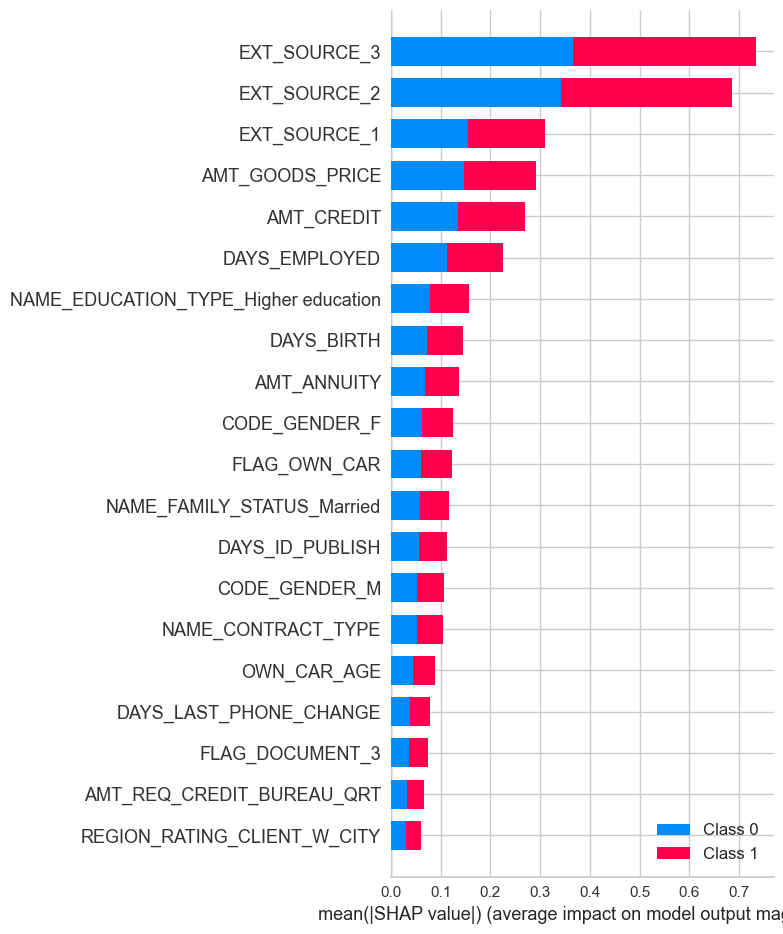

In [115]:
shap.summary_plot(shap_values, X_train_encoded, feature_names=features, show=False)

In [116]:
# Create a DataFrame using the numpy array and column names
X_test_encoded = pd.DataFrame(test, columns=features)

In [117]:
X_test_encoded

,SK_ID_CURR,NAME_CONTRACT_TYPE,FLAG_OWN_CAR,FLAG_OWN_REALTY,CNT_CHILDREN,AMT_INCOME_TOTAL,AMT_CREDIT,AMT_ANNUITY,AMT_GOODS_PRICE,REGION_POPULATION_RELATIVE,DAYS_BIRTH,DAYS_EMPLOYED,DAYS_REGISTRATION,DAYS_ID_PUBLISH,OWN_CAR_AGE,FLAG_MOBIL,FLAG_EMP_PHONE,FLAG_WORK_PHONE,FLAG_CONT_MOBILE,FLAG_PHONE,FLAG_EMAIL,CNT_FAM_MEMBERS,REGION_RATING_CLIENT,REGION_RATING_CLIENT_W_CITY,HOUR_APPR_PROCESS_START,REG_REGION_NOT_LIVE_REGION,REG_REGION_NOT_WORK_REGION,LIVE_REGION_NOT_WORK_REGION,REG_CITY_NOT_LIVE_CITY,REG_CITY_NOT_WORK_CITY,LIVE_CITY_NOT_WORK_CITY,EXT_SOURCE_1,EXT_SOURCE_2,EXT_SOURCE_3,APARTMENTS_AVG,BASEMENTAREA_AVG,YEARS_BEGINEXPLUATATION_AVG,YEARS_BUILD_AVG,COMMONAREA_AVG,ELEVATORS_AVG,ENTRANCES_AVG,FLOORSMAX_AVG,FLOORSMIN_AVG,LANDAREA_AVG,LIVINGAPARTMENTS_AVG,LIVINGAREA_AVG,NONLIVINGAPARTMENTS_AVG,NONLIVINGAREA_AVG,APARTMENTS_MODE,BASEMENTAREA_MODE,YEARS_BEGINEXPLUATATION_MODE,YEARS_BUILD_MODE,COMMONAREA_MODE,ELEVATORS_MODE,ENTRANCES_MODE,FLOORSMAX_MODE,FLOORSMIN_MODE,LANDAREA_MODE,LIVINGAPARTMENTS_MODE,LIVINGAREA_MODE,NONLIVINGAPARTMENTS_MODE,NONLIVINGAREA_MODE,APARTMENTS_MEDI,BASEMENTAREA_MEDI,YEARS_BEGINEXPLUATATION_MEDI,YEARS_BUILD_MEDI,COMMONAREA_MEDI,ELEVATORS_MEDI,ENTRANCES_MEDI,FLOORSMAX_MEDI,FLOORSMIN_MEDI,LANDAREA_MEDI,LIVINGAPARTMENTS_MEDI,LIVINGAREA_MEDI,NONLIVINGAPARTMENTS_MEDI,NONLIVINGAREA_MEDI,TOTALAREA_MODE,OBS_30_CNT_SOCIAL_CIRCLE,DEF_30_CNT_SOCIAL_CIRCLE,OBS_60_CNT_SOCIAL_CIRCLE,DEF_60_CNT_SOCIAL_CIRCLE,DAYS_LAST_PHONE_CHANGE,FLAG_DOCUMENT_2,FLAG_DOCUMENT_3,FLAG_DOCUMENT_4,FLAG_DOCUMENT_5,FLAG_DOCUMENT_6,FLAG_DOCUMENT_7,FLAG_DOCUMENT_8,FLAG_DOCUMENT_9,FLAG_DOCUMENT_10,FLAG_DOCUMENT_11,FLAG_DOCUMENT_12,FLAG_DOCUMENT_13,FLAG_DOCUMENT_14,FLAG_DOCUMENT_15,FLAG_DOCUMENT_16,FLAG_DOCUMENT_17,FLAG_DOCUMENT_18,FLAG_DOCUMENT_19,FLAG_DOCUMENT_20,FLAG_DOCUMENT_21,AMT_REQ_CREDIT_BUREAU_HOUR,AMT_REQ_CREDIT_BUREAU_DAY,AMT_REQ_CREDIT_BUREAU_WEEK,AMT_REQ_CREDIT_BUREAU_MON,AMT_REQ_CREDIT_BUREAU_QRT,AMT_REQ_CREDIT_BUREAU_YEAR,CODE_GENDER_F,CODE_GENDER_M,NAME_TYPE_SUITE_Children,NAME_TYPE_SUITE_Family,NAME_TYPE_SUITE_Group of people,NAME_TYPE_SUITE_Other_A,NAME_TYPE_SUITE_Other_B,"NAME_TYPE_SUITE_Spouse, partner",NAME_TYPE_SUITE_Unaccompanied,NAME_INCOME_TYPE_Businessman,NAME_INCOME_TYPE_Commercial associate,NAME_INCOME_TYPE_Pensioner,NAME_INCOME_TYPE_State servant,NAME_INCOME_TYPE_Student,NAME_INCOME_TYPE_Unemployed,NAME_INCOME_TYPE_Working,NAME_EDUCATION_TYPE_Academic degree,NAME_EDUCATION_TYPE_Higher education,NAME_EDUCATION_TYPE_Incomplete higher,NAME_EDUCATION_TYPE_Lower secondary,NAME_EDUCATION_TYPE_Secondary / secondary special,NAME_FAMILY_STATUS_Civil marriage,NAME_FAMILY_STATUS_Married,NAME_FAMILY_STATUS_Separated,NAME_FAMILY_STATUS_Single / not married,NAME_FAMILY_STATUS_Widow,NAME_HOUSING_TYPE_Co-op apartment,NAME_HOUSING_TYPE_House / apartment,NAME_HOUSING_TYPE_Municipal apartment,NAME_HOUSING_TYPE_Office apartment,NAME_HOUSING_TYPE_Rented apartment,NAME_HOUSING_TYPE_With parents,OCCUPATION_TYPE_Accountants,OCCUPATION_TYPE_Cleaning staff,OCCUPATION_TYPE_Cooking staff,OCCUPATION_TYPE_Core staff,OCCUPATION_TYPE_Drivers,OCCUPATION_TYPE_HR staff,OCCUPATION_TYPE_High skill tech staff,OCCUPATION_TYPE_IT staff,OCCUPATION_TYPE_Laborers,OCCUPATION_TYPE_Low-skill Laborers,OCCUPATION_TYPE_Managers,OCCUPATION_TYPE_Medicine staff,OCCUPATION_TYPE_Private service staff,OCCUPATION_TYPE_Realty agents,OCCUPATION_TYPE_Sales staff,OCCUPATION_TYPE_Secretaries,OCCUPATION_TYPE_Security staff,OCCUPATION_TYPE_Waiters/barmen staff,WEEKDAY_APPR_PROCESS_START_FRIDAY,WEEKDAY_APPR_PROCESS_START_MONDAY,WEEKDAY_APPR_PROCESS_START_SATURDAY,WEEKDAY_APPR_PROCESS_START_SUNDAY,WEEKDAY_APPR_PROCESS_START_THURSDAY,WEEKDAY_APPR_PROCESS_START_TUESDAY,WEEKDAY_APPR_PROCESS_START_WEDNESDAY,ORGANIZATION_TYPE_Advertising,ORGANIZATION_TYPE_Agriculture,ORGANIZATION_TYPE_Bank,ORGANIZATION_TYPE_Business Entity Type 1,ORGANIZATION_TYPE_Business Entity Type 2,ORGANIZATION_TYPE_Business Entity Type 3,ORGANIZATION_TYPE_Cleaning,ORGANIZATION_TYPE_Construction,ORGANIZATIO

In [121]:
df_application_train

,SK_ID_CURR,NAME_CONTRACT_TYPE,FLAG_OWN_CAR,FLAG_OWN_REALTY,CNT_CHILDREN,AMT_INCOME_TOTAL,AMT_CREDIT,AMT_ANNUITY,AMT_GOODS_PRICE,REGION_POPULATION_RELATIVE,DAYS_BIRTH,DAYS_EMPLOYED,DAYS_REGISTRATION,DAYS_ID_PUBLISH,OWN_CAR_AGE,FLAG_MOBIL,FLAG_EMP_PHONE,FLAG_WORK_PHONE,FLAG_CONT_MOBILE,FLAG_PHONE,FLAG_EMAIL,CNT_FAM_MEMBERS,REGION_RATING_CLIENT,REGION_RATING_CLIENT_W_CITY,HOUR_APPR_PROCESS_START,REG_REGION_NOT_LIVE_REGION,REG_REGION_NOT_WORK_REGION,LIVE_REGION_NOT_WORK_REGION,REG_CITY_NOT_LIVE_CITY,REG_CITY_NOT_WORK_CITY,LIVE_CITY_NOT_WORK_CITY,EXT_SOURCE_1,EXT_SOURCE_2,EXT_SOURCE_3,APARTMENTS_AVG,BASEMENTAREA_AVG,YEARS_BEGINEXPLUATATION_AVG,YEARS_BUILD_AVG,COMMONAREA_AVG,ELEVATORS_AVG,ENTRANCES_AVG,FLOORSMAX_AVG,FLOORSMIN_AVG,LANDAREA_AVG,LIVINGAPARTMENTS_AVG,LIVINGAREA_AVG,NONLIVINGAPARTMENTS_AVG,NONLIVINGAREA_AVG,APARTMENTS_MODE,BASEMENTAREA_MODE,YEARS_BEGINEXPLUATATION_MODE,YEARS_BUILD_MODE,COMMONAREA_MODE,ELEVATORS_MODE,ENTRANCES_MODE,FLOORSMAX_MODE,FLOORSMIN_MODE,LANDAREA_MODE,LIVINGAPARTMENTS_MODE,LIVINGAREA_MODE,NONLIVINGAPARTMENTS_MODE,NONLIVINGAREA_MODE,APARTMENTS_MEDI,BASEMENTAREA_MEDI,YEARS_BEGINEXPLUATATION_MEDI,YEARS_BUILD_MEDI,COMMONAREA_MEDI,ELEVATORS_MEDI,ENTRANCES_MEDI,FLOORSMAX_MEDI,FLOORSMIN_MEDI,LANDAREA_MEDI,LIVINGAPARTMENTS_MEDI,LIVINGAREA_MEDI,NONLIVINGAPARTMENTS_MEDI,NONLIVINGAREA_MEDI,TOTALAREA_MODE,OBS_30_CNT_SOCIAL_CIRCLE,DEF_30_CNT_SOCIAL_CIRCLE,OBS_60_CNT_SOCIAL_CIRCLE,DEF_60_CNT_SOCIAL_CIRCLE,DAYS_LAST_PHONE_CHANGE,FLAG_DOCUMENT_2,FLAG_DOCUMENT_3,FLAG_DOCUMENT_4,FLAG_DOCUMENT_5,FLAG_DOCUMENT_6,FLAG_DOCUMENT_7,FLAG_DOCUMENT_8,FLAG_DOCUMENT_9,FLAG_DOCUMENT_10,FLAG_DOCUMENT_11,FLAG_DOCUMENT_12,FLAG_DOCUMENT_13,FLAG_DOCUMENT_14,FLAG_DOCUMENT_15,FLAG_DOCUMENT_16,FLAG_DOCUMENT_17,FLAG_DOCUMENT_18,FLAG_DOCUMENT_19,FLAG_DOCUMENT_20,FLAG_DOCUMENT_21,AMT_REQ_CREDIT_BUREAU_HOUR,AMT_REQ_CREDIT_BUREAU_DAY,AMT_REQ_CREDIT_BUREAU_WEEK,AMT_REQ_CREDIT_BUREAU_MON,AMT_REQ_CREDIT_BUREAU_QRT,AMT_REQ_CREDIT_BUREAU_YEAR,CODE_GENDER_F,CODE_GENDER_M,NAME_TYPE_SUITE_Children,NAME_TYPE_SUITE_Family,NAME_TYPE_SUITE_Group of people,NAME_TYPE_SUITE_Other_A,NAME_TYPE_SUITE_Other_B,"NAME_TYPE_SUITE_Spouse, partner",NAME_TYPE_SUITE_Unaccompanied,NAME_INCOME_TYPE_Businessman,NAME_INCOME_TYPE_Commercial associate,NAME_INCOME_TYPE_Pensioner,NAME_INCOME_TYPE_State servant,NAME_INCOME_TYPE_Student,NAME_INCOME_TYPE_Unemployed,NAME_INCOME_TYPE_Working,NAME_EDUCATION_TYPE_Academic degree,NAME_EDUCATION_TYPE_Higher education,NAME_EDUCATION_TYPE_Incomplete higher,NAME_EDUCATION_TYPE_Lower secondary,NAME_EDUCATION_TYPE_Secondary / secondary special,NAME_FAMILY_STATUS_Civil marriage,NAME_FAMILY_STATUS_Married,NAME_FAMILY_STATUS_Separated,NAME_FAMILY_STATUS_Single / not married,NAME_FAMILY_STATUS_Widow,NAME_HOUSING_TYPE_Co-op apartment,NAME_HOUSING_TYPE_House / apartment,NAME_HOUSING_TYPE_Municipal apartment,NAME_HOUSING_TYPE_Office apartment,NAME_HOUSING_TYPE_Rented apartment,NAME_HOUSING_TYPE_With parents,OCCUPATION_TYPE_Accountants,OCCUPATION_TYPE_Cleaning staff,OCCUPATION_TYPE_Cooking staff,OCCUPATION_TYPE_Core staff,OCCUPATION_TYPE_Drivers,OCCUPATION_TYPE_HR staff,OCCUPATION_TYPE_High skill tech staff,OCCUPATION_TYPE_IT staff,OCCUPATION_TYPE_Laborers,OCCUPATION_TYPE_Low-skill Laborers,OCCUPATION_TYPE_Managers,OCCUPATION_TYPE_Medicine staff,OCCUPATION_TYPE_Private service staff,OCCUPATION_TYPE_Realty agents,OCCUPATION_TYPE_Sales staff,OCCUPATION_TYPE_Secretaries,OCCUPATION_TYPE_Security staff,OCCUPATION_TYPE_Waiters/barmen staff,WEEKDAY_APPR_PROCESS_START_FRIDAY,WEEKDAY_APPR_PROCESS_START_MONDAY,WEEKDAY_APPR_PROCESS_START_SATURDAY,WEEKDAY_APPR_PROCESS_START_SUNDAY,WEEKDAY_APPR_PROCESS_START_THURSDAY,WEEKDAY_APPR_PROCESS_START_TUESDAY,WEEKDAY_APPR_PROCESS_START_WEDNESDAY,ORGANIZATION_TYPE_Advertising,ORGANIZATION_TYPE_Agriculture,ORGANIZATION_TYPE_Bank,ORGANIZATION_TYPE_Business Entity Type 1,ORGANIZATION_TYPE_Business Entity Type 2,ORGANIZATION_TYPE_Business Entity Type 3,ORGANIZATION_TYPE_Cleaning,ORGANIZATION_TYPE_Construction,ORGANIZATIO

In [122]:
import zipfile
with zipfile.ZipFile('df_application_test.zip', 'w', zipfile.ZIP_DEFLATED) as zf1:
    # Save the dataframe to a temporary CSV file
    csv_data = df_application_test.to_csv(index=False)
    zf1.writestr('test.csv', csv_data)

In [123]:
with zipfile.ZipFile('df_application_train.zip', 'w', zipfile.ZIP_DEFLATED) as zf1:
    # Save the dataframe to a temporary CSV file
    csv_data = df_application_train.to_csv(index=False)
    zf1.writestr('train.csv', csv_data)

In [124]:
with zipfile.ZipFile('X_encoded.zip', 'w', zipfile.ZIP_DEFLATED) as zf2:
    # Save the dataframe to a temporary CSV file
    csv_data = X_test_encoded.to_csv(index=False)
    zf2.writestr('X_test_encoded.csv', csv_data)

# Local feature importance 

In [126]:
import random

random_index = random.randint(0, len(X_test_encoded) - 1)
X_random_sample = X_test_encoded.iloc[random_index].values.reshape(1, -1)

explainer = shap.TreeExplainer(lgbm_classifier)

shap_values = explainer.shap_values(X_random_sample)[0][0]

# Compute absolute SHAP values
abs_shap_values = [abs(val) for val in shap_values]

# Sort the SHAP values and get the corresponding column indices
sorted_indices = list(range(len(abs_shap_values)))
sorted_indices.sort(key=lambda i: abs_shap_values[i], reverse=True)

N = 10
top_feature_indices = sorted_indices[:N]
top_feature_names = [features[i] for i in top_feature_indices]
top_feature_shap_values = [shap_values[i] for i in top_feature_indices]

# Create a DataFrame for the top features and their SHAP values
top_features_df = pd.DataFrame({'Feature': top_feature_names, 'SHAP Value': top_feature_shap_values})



Usage of np.ndarray subset (sliced data) is not recommended due to it will double the peak memory cost in LightGBM.
LightGBM binary classifier with TreeExplainer shap values output has changed to a list of ndarray


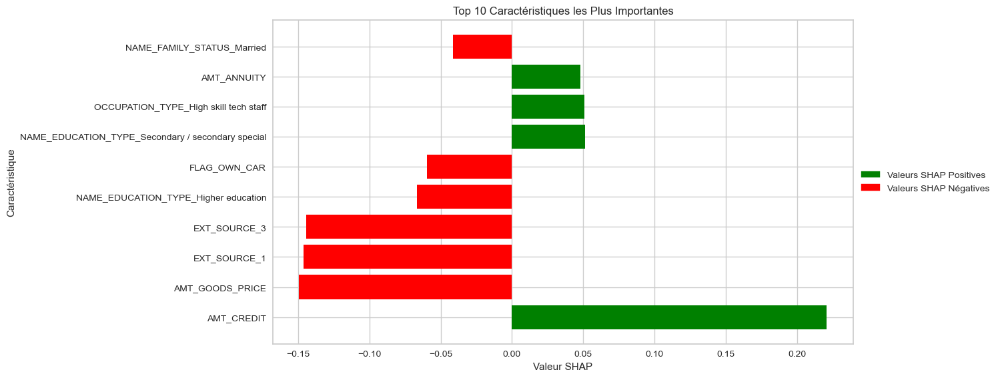

In [127]:
N = 10  # Nombre de caractéristiques à afficher

# Triez le dataframe par les valeurs SHAP absolues
top_features_df = top_features_df.iloc[np.argsort(np.abs(top_features_df['SHAP Value']))[::-1][:N]]

# Créez le diagramme en barres
fig, ax = plt.subplots(figsize=(10, 6))
bars = ax.barh(top_features_df['Feature'], top_features_df['SHAP Value'], color=np.where(top_features_df['SHAP Value'] > 0, 'green', 'red'))

# Ajoutez des étiquettes et un titre
ax.set_xlabel('Valeur SHAP')
ax.set_ylabel('Caractéristique')
ax.set_title(f'Top {N} Caractéristiques les Plus Importantes')

# Ajoutez une légende de couleur à l'extérieur du tracé
legend_labels = ['Valeurs SHAP Positives', 'Valeurs SHAP Négatives']
legend_colors = ['green', 'red']
ax.legend(handles=[plt.Rectangle((0, 0), 1, 1, color=color) for color in legend_colors], labels=legend_labels, loc='center left', bbox_to_anchor=(1, 0.5))

plt.show()

In [128]:
top_features_df['Feature']

0                                           AMT_CREDIT
1                                      AMT_GOODS_PRICE
2                                         EXT_SOURCE_1
3                                         EXT_SOURCE_3
4                 NAME_EDUCATION_TYPE_Higher education
5                                         FLAG_OWN_CAR
6    NAME_EDUCATION_TYPE_Secondary / secondary special
7                OCCUPATION_TYPE_High skill tech staff
8                                          AMT_ANNUITY
9                           NAME_FAMILY_STATUS_Married
Name: Feature, dtype: object

In [129]:
import random

X_random_sample = X_test_encoded.iloc[random_index].values.reshape(1, -1)

explainer = shap.TreeExplainer(lgbm_classifier)

shap_values = explainer.shap_values(X_random_sample)[0]

# Assuming shap_values is a numpy array
shap.force_plot(explainer.expected_value[0], shap_values[0], X_random_sample, feature_names=features)


Usage of np.ndarray subset (sliced data) is not recommended due to it will double the peak memory cost in LightGBM.
LightGBM binary classifier with TreeExplainer shap values output has changed to a list of ndarray
